In [1]:
library(dplyr)
library(ggplot2)
library(ggbeeswarm)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



In [2]:
### Example of interaction with ROT that is not interaction with maturation stage

In [3]:
## genotype file
genos = read.table("/hps/nobackup/hipsci/scratch/genotypes/imputed/2017-03-27/Anna_selection_2020/neuroseq_Jan27.dosages.txt")
colnames(genos) = gsub("\\.","-",colnames(genos))

In [4]:
### annotation file (map genes IDs)
annos_file = "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/scQTLs/annos/combined_feature_id_annos.tsv"
annos = read.csv(annos_file,sep="\t")
# head(annos,2)
annos$feature_id = annos$ensembl_gene_id
head(annos,2)

feature_id,chromosome,start,end,hgnc_symbol,combined_feature_id,ensembl_gene_id
<fct>,<fct>,<int>,<int>,<fct>,<fct>,<fct>
ENSG00000000003,X,99883667,99894988,TSPAN6,ENSG00000000003_TSPAN6,ENSG00000000003
ENSG00000000419,20,49551404,49575092,DPM1,ENSG00000000419_DPM1,ENSG00000000419


In [5]:
mydir = '/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/'
DA = 'pool1_17_D52/pool1_17_D52.scanpy.w_metadata.w_celltype.scanpy.celltype.DA.groupedby.donor_id-celltype-treatment.mean.tsv'
e_DA = read.csv(paste0(mydir,DA),sep="\t")

In [6]:
e = e_DA
e_ROT = e[e$treatment == "ROT",]
rownames(e_ROT) = e_ROT$donor_id
e_noROT = e[e$treatment == "NONE",]
rownames(e_noROT) = e_noROT$donor_id

In [7]:
## DA (ROT inter)
ROT_inter_DA = "/hps/nobackup/stegle/users/acuomo/all_scripts/sc_neuroseq/eqtl/interaction_qtl/treatment_D52/celltype_DA/treatment_interaction_test_100cellfilter_top_qtl_results_all/top_qtl_results_all.txt"
int_DA = read.csv(ROT_inter_DA,sep="\t")
nrow(int_DA)
int_DA$q_value = p.adjust(int_DA$p_value, "BH")
nrow(int_DA[int_DA$q_value < 0.05,])

[1] 3354

[1] 92

In [8]:
res = int_DA
res[-log10(res$p_value)*sign(res$beta) > 5,c("snp_id","feature_id")]
res[-log10(res$p_value)*sign(res$beta) < -5,c("snp_id","feature_id")]

,snp_id,feature_id
,<fct>,<fct>
359,9_33010550_C_T,ENSG00000086061
441,9_108454343_A_G,ENSG00000095209
1488,2_114222420_C_T,ENSG00000136682
1827,7_6884764_A_C,ENSG00000146574
1881,11_34905987_T_C,ENSG00000149089
2596,11_68010721_A_G,ENSG00000171067


,snp_id,feature_id
,<fct>,<fct>
672,19_3879503_A_G,ENSG00000105278
834,12_121671970_C_G,ENSG00000110931
1091,17_44344239_A_T,ENSG00000120071
1469,13_52716189_G_C,ENSG00000136098
2228,2_219083318_G_T,ENSG00000163466
2311,7_879157_G_C,ENSG00000164828
2354,10_119020918_A_G,ENSG00000165646
2485,3_57665807_C_T,ENSG00000168374
2637,5_43429964_A_G,ENSG00000172244


In [341]:
snps_positive = res[-log10(res$p_value)*sign(res$beta) > 5,"snp_id"]
snps_negative = res[-log10(res$p_value)*sign(res$beta) < -5,"snp_id"]

In [9]:
col_NONE = "darkgrey"
col_ROT = "firebrick"

[1] "DNAJA1"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

[1] 1.690916 1.516049
[1] "TMEM38B"
[1] 0.1079452 0.1447856
[1] "CBWD2"


Warning message:
“Removed 14 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 14 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 14 rows containing missing values (position_quasirandom).”

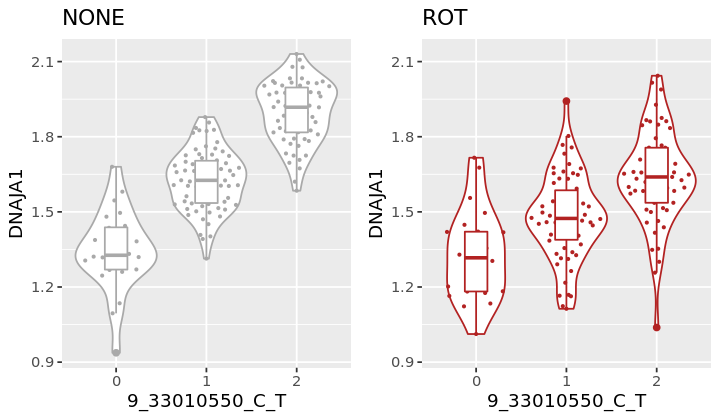

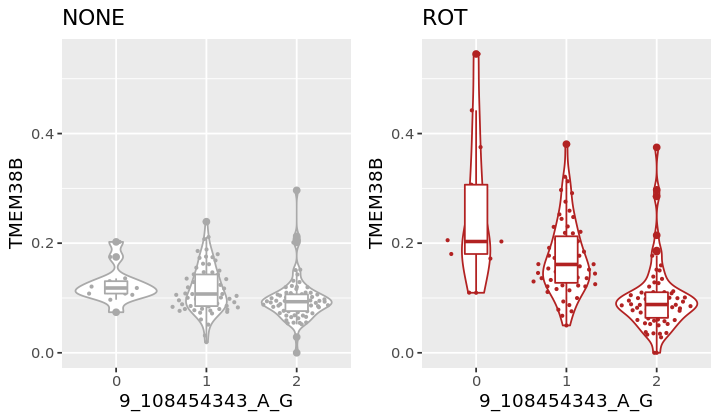

[1] 0.13405038 0.09070066
[1] "CCZ1B"
[1] 0.1146781 0.0849461
[1] "APIP"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

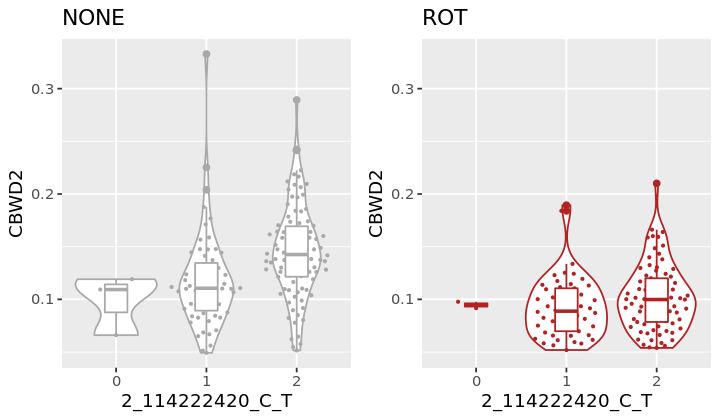

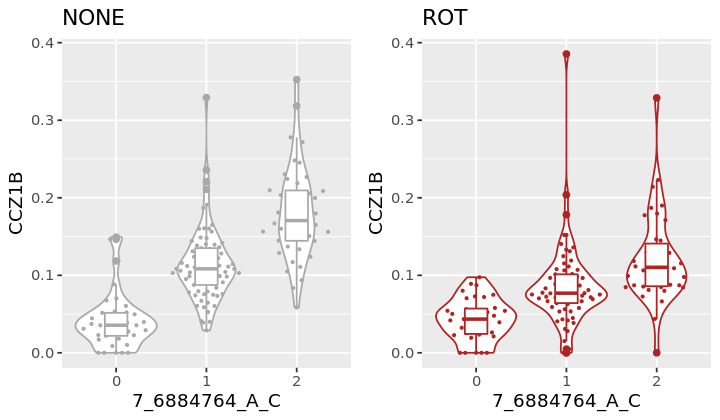

[1] 0.1567887 0.1273498
[1] "C11orf24"


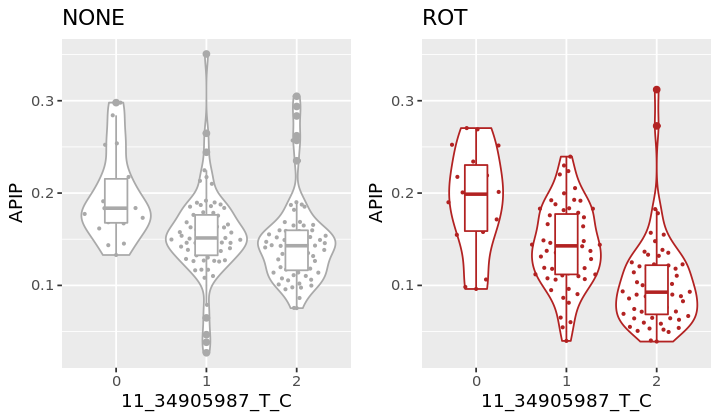

[1] 0.08888244 0.06413885


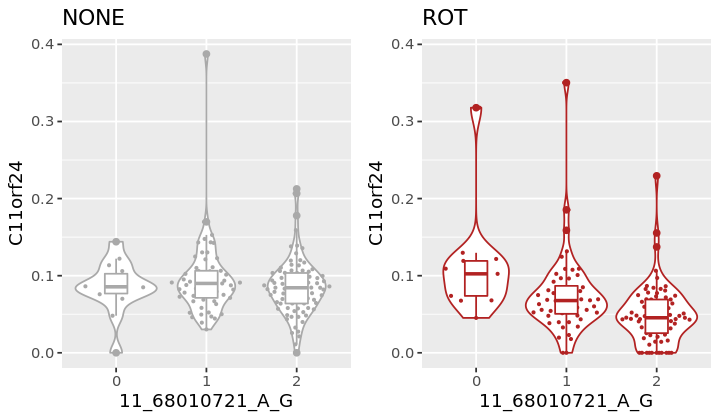

In [396]:
for (i in 1:length(snps_positive)){
#     print(i)
    snp = as.character(snps_positive[i])
#     print(snp)
    gene = as.character(int_DA[int_DA$snp_id == snp,"feature_id"])
#     print(gene)
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    print(gene_name)
    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    e1 = e_noROT[,c("donor_id",gene_name)]
    e1$donor_id = as.character(e1$donor_id)
    df1 = inner_join(e1,g,by = "donor_id")
    colnames(df1)[2] = "gene"
    df1$genotypes <- round(df1$dosages)
#     print(head(df1,2))
    e2 = e_ROT[,c("donor_id",gene_name)]
    e2$donor_id = as.character(e2$donor_id)
    df2 = inner_join(e2,g,by = "donor_id")
    colnames(df2)[2] = "gene"
    df2$genotypes <- round(df2$dosages)
#     print(head(df2,2))   
    m = min(min(df1$gene),min(df1$gene))
    M = max(max(df1$gene),max(df2$gene))
    p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin(col = col_NONE) + 
                xlab(snp) + ylab(gene_name) +  geom_quasirandom(size = 0.5, col = col_NONE) + 
                geom_boxplot(width = 0.25, col = col_NONE) + ylim(c(m,M)) + ggtitle("NONE")
    p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin(col = col_ROT) + 
                xlab(snp) + ylab(gene_name) + geom_quasirandom(size = 0.5, col = col_ROT) + 
                geom_boxplot(width = 0.25, col = col_ROT) + ylim(c(m,M)) +  ggtitle("ROT")
    options(repr.plot.width=6, repr.plot.height=3.5)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
    print(c(mean(df1$gene),mean(df2$gene)))
}

[1] "ZFR2"


Warning message:
“Removed 29 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 29 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 29 rows containing missing values (position_quasirandom).”

[1] 0.2871350 0.1338744
[1] "CAMKK2"
[1] 0.12944041 0.05904865
[1] "KANSL1"


Warning message:
“Removed 12 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 12 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 12 rows containing missing values (position_quasirandom).”

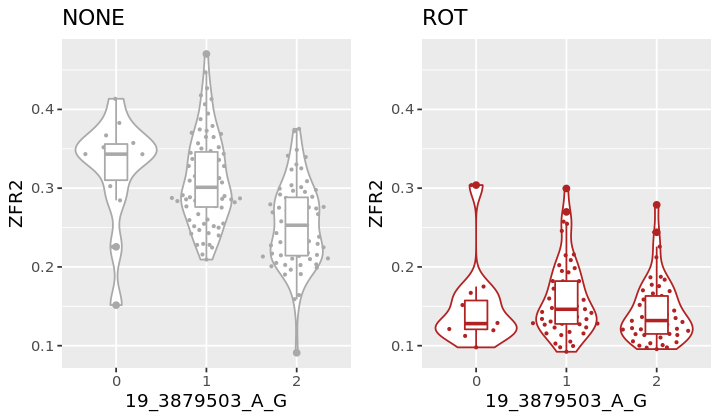

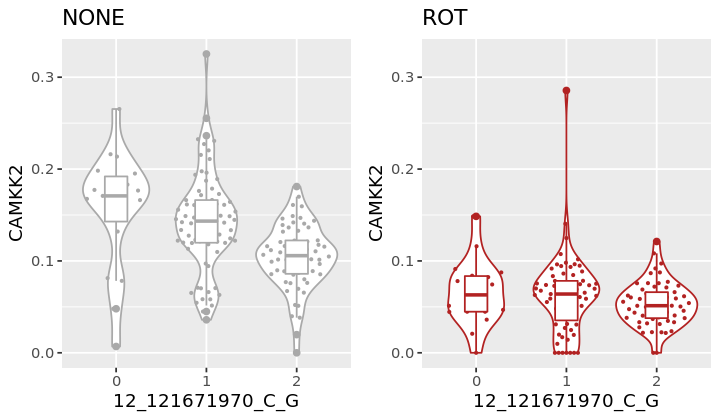

[1] 0.12225851 0.07996029
[1] "NEK3"
[1] 0.07571516 0.08370004
[1] "ARPC2"


Warning message:
“Removed 38 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 38 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 38 rows containing missing values (position_quasirandom).”

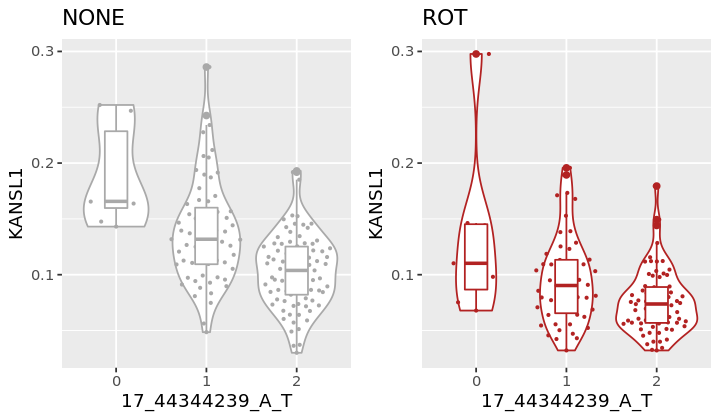

[1] 1.743350 1.497394
[1] "SUN1"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

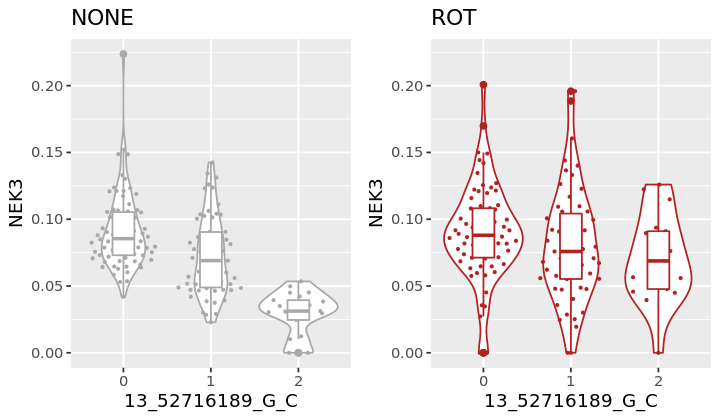

[1] 0.1881219 0.2264550


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

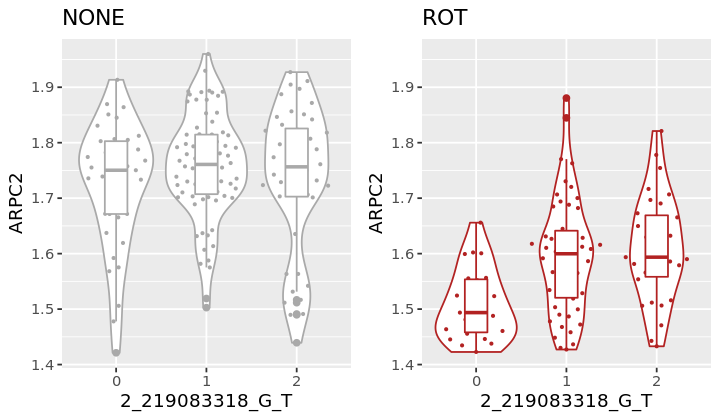

[1] "SLC18A2" "PDZD8"  
[1] 0.05487649 0.08645959
[1] "ARF4"


Warning message:
“Removed 2 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (position_quasirandom).”

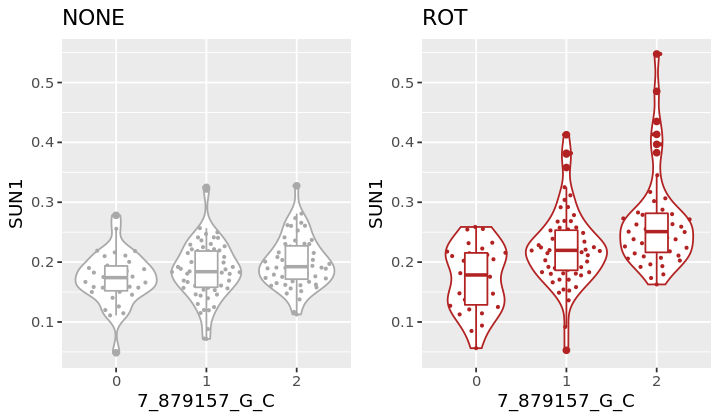

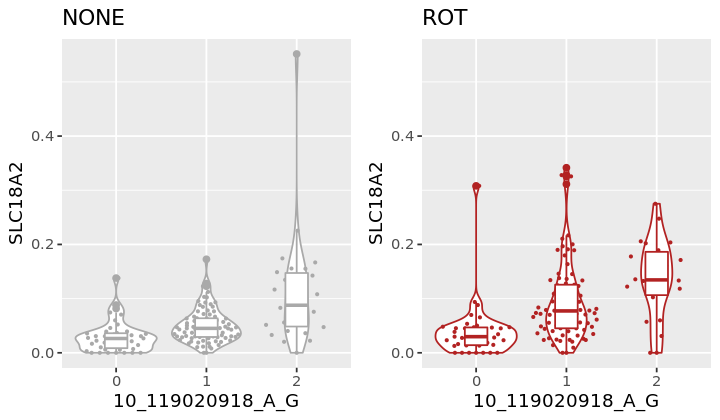

[1] 1.223496 1.252712
[1] "C5orf34"
[1] 0.007412012 0.045603004
[1] "NUDT14"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

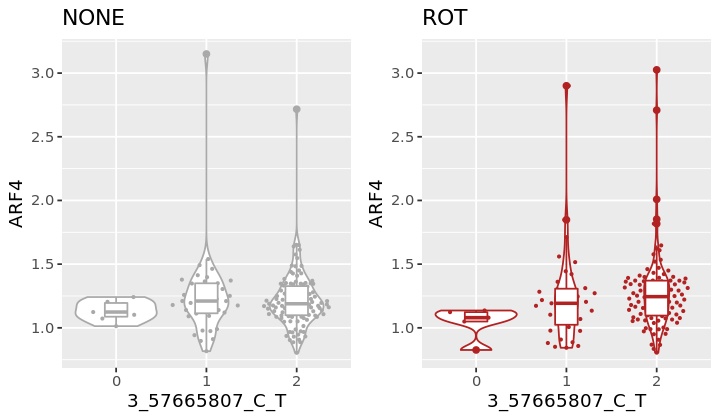

[1] 0.4616539 0.4367224
[1] "TTC32"


Warning message:
“Removed 9 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 9 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 9 rows containing missing values (position_quasirandom).”

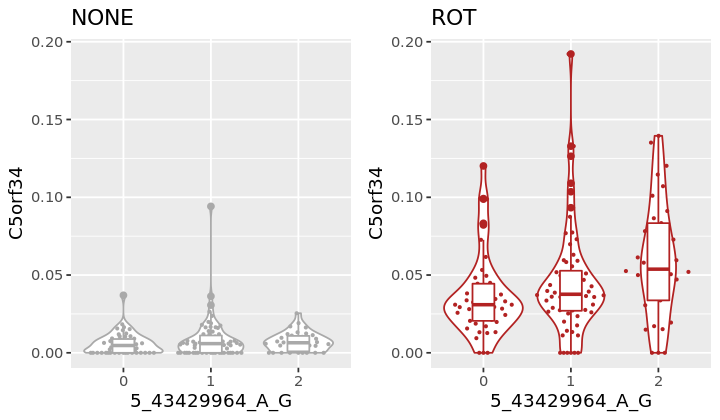

[1] 0.14501425 0.07747874


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

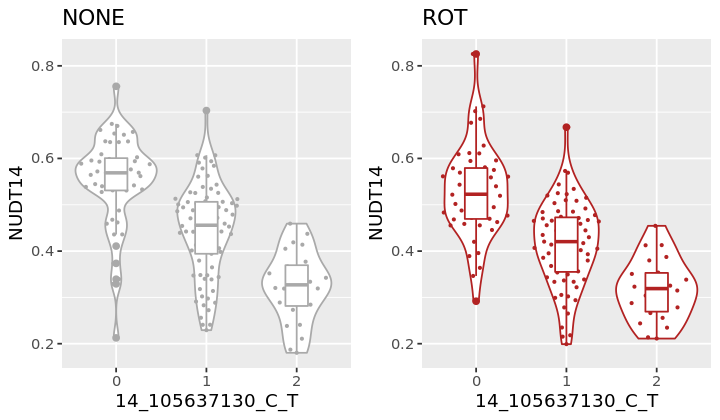

[1] "RPL41"


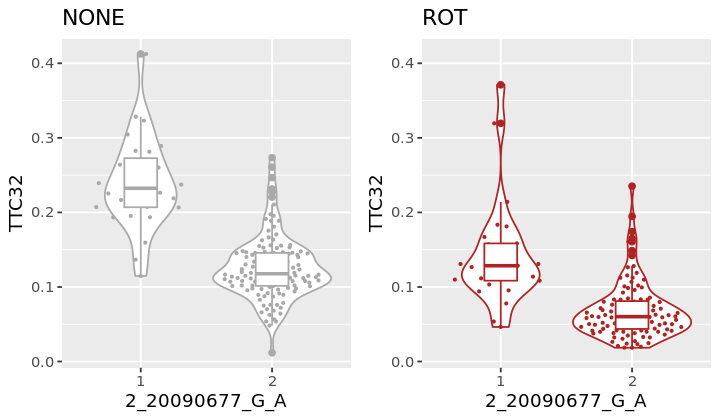

[1] 3.311843 3.514020
[1] "DHFR"
[1] 0.05510317 0.01567347
[1] "C7orf73"


Warning message:
“Removed 3 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 3 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 3 rows containing missing values (position_quasirandom).”

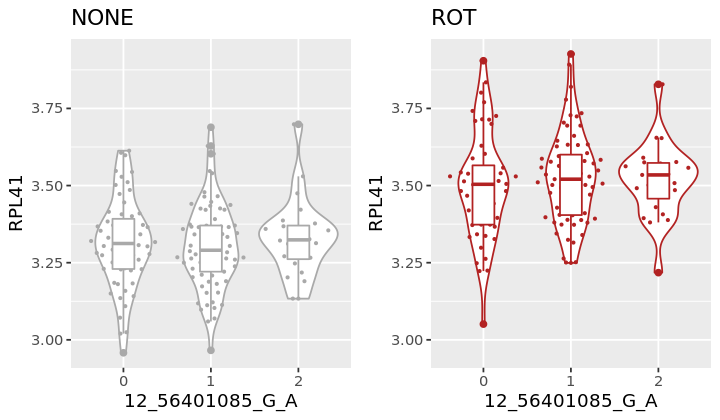

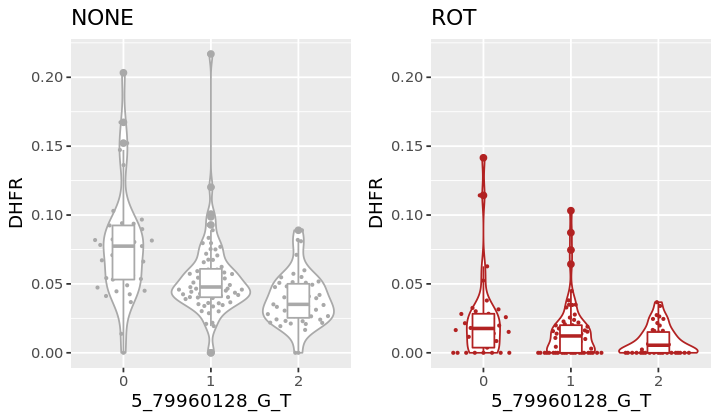

[1] 0.8425954 0.8686337


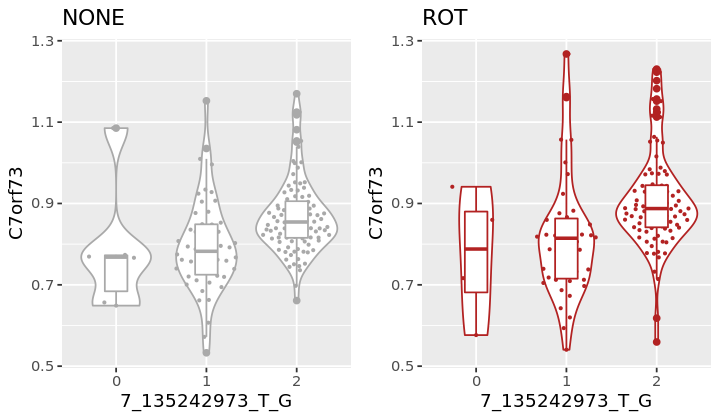

In [398]:
for (i in 1:length(snps_negative)){
#     print(i)
    snp = as.character(snps_negative[i])
#     print(snp)
    gene = as.character(int_DA[int_DA$snp_id == snp,"feature_id"])
#     print(gene)
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    print(gene_name)
    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    e1 = e_noROT[,c("donor_id",gene_name)]
    e1$donor_id = as.character(e1$donor_id)
    df1 = inner_join(e1,g,by = "donor_id")
    colnames(df1)[2] = "gene"
    df1$genotypes <- round(df1$dosages)
#     print(head(df1,2))
    e2 = e_ROT[,c("donor_id",gene_name)]
    e2$donor_id = as.character(e2$donor_id)
    df2 = inner_join(e2,g,by = "donor_id")
    colnames(df2)[2] = "gene"
    df2$genotypes <- round(df2$dosages)
#     print(head(df2,2))   
    m = min(min(df1$gene),min(df1$gene))
    M = max(max(df1$gene),max(df2$gene))
    p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin(col = col_NONE) + 
                xlab(snp) + ylab(gene_name) +  geom_quasirandom(size = 0.5, col = col_NONE) + 
                geom_boxplot(width = 0.25, col = col_NONE) + ylim(c(m,M)) + ggtitle("NONE")
    p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin(col = col_ROT) + 
                xlab(snp) + ylab(gene_name) + geom_quasirandom(size = 0.5, col = col_ROT) + 
                geom_boxplot(width = 0.25, col = col_ROT) + ylim(c(m,M)) +  ggtitle("ROT")
    options(repr.plot.width=6, repr.plot.height=3.5)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
    print(c(mean(df1$gene),mean(df2$gene)))
}

In [10]:
res = int_DA[int_DA$q_value < 0.05,]
snps = res$snp_id

In [12]:
length(snps)

[1] 92

[1] "PIGQ"
[1] 0.1301727 0.1581975
[1] "XYLT2"


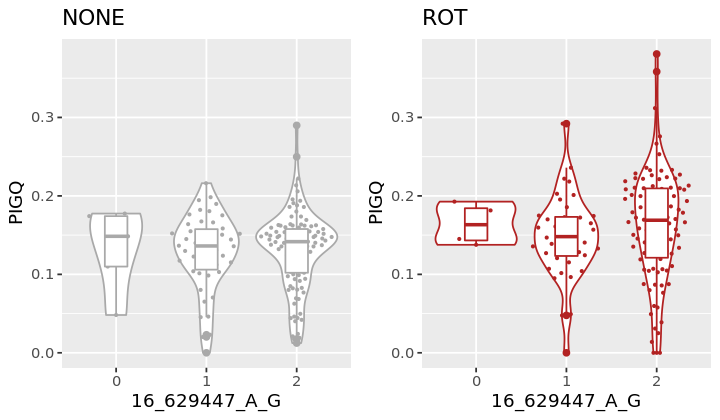

[1] 0.02787031 0.02479269
[1] "CHDH"


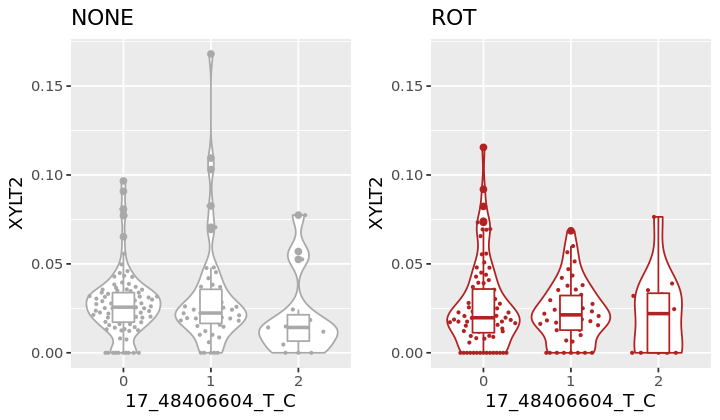

[1] 0.04165816 0.01489238
[1] "NSUN2"


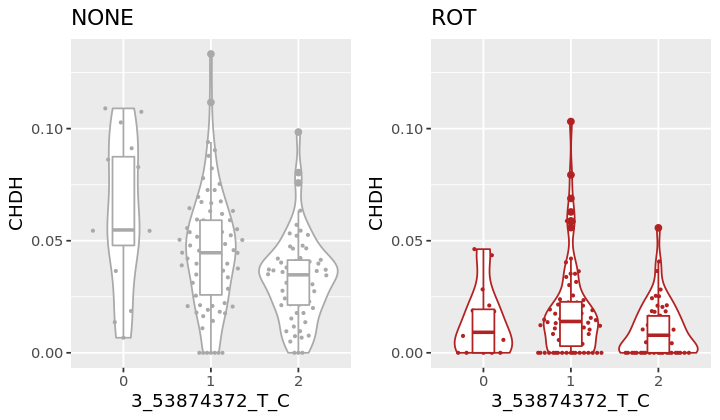

[1] 0.06980261 0.02800593
[1] "MRI1"
[1] 0.08544649 0.05127920
[1] "MTHFD2"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

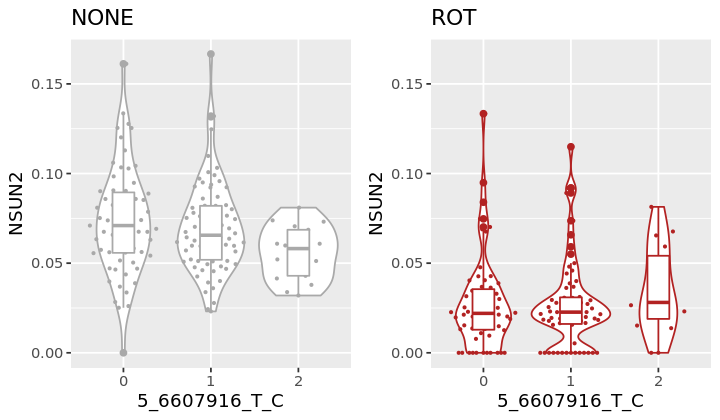

[1] 0.3256477 0.4251878
[1] "CRMP1"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

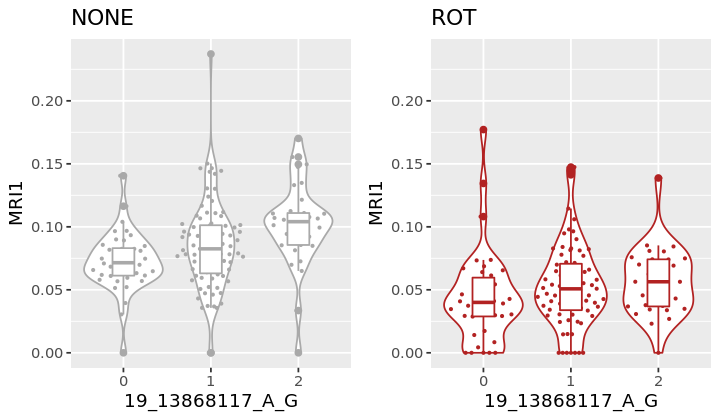

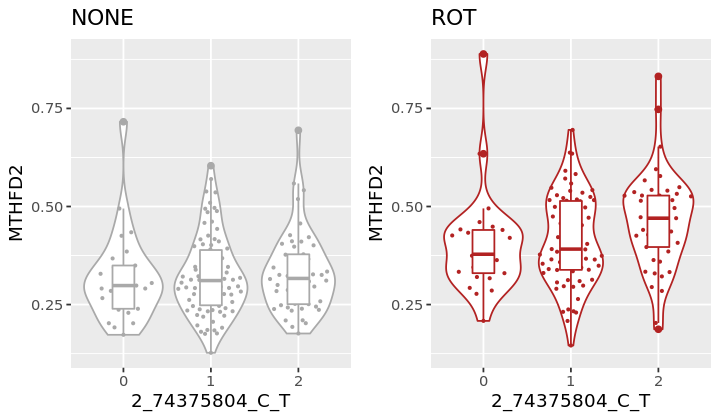

[1] 1.804732 1.763644
[1] "ZNF37A"
[1] 0.13448250 0.06101255
[1] "DNAJA1"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

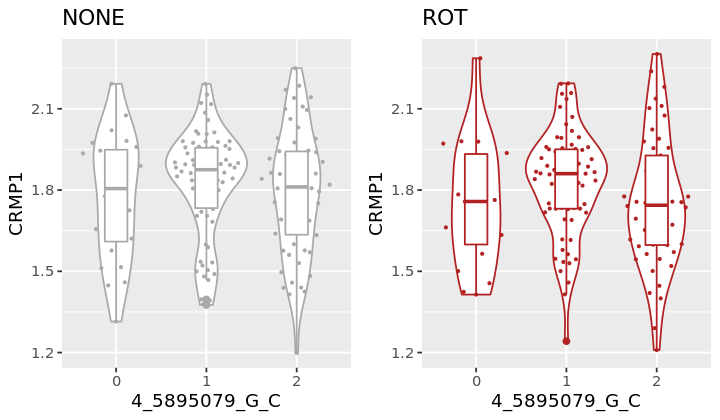

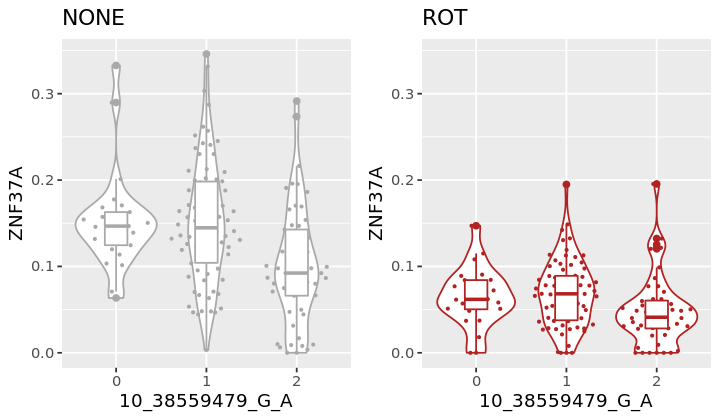

[1] 1.690916 1.516049
[1] "CECR1"


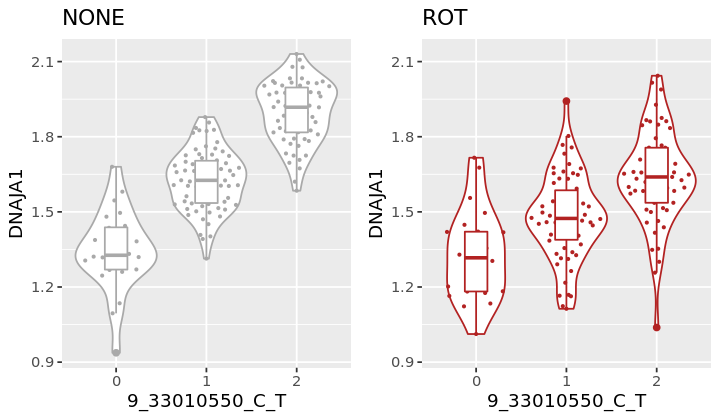

[1] 0.08182503 0.10111959
[1] "TMEM38B"


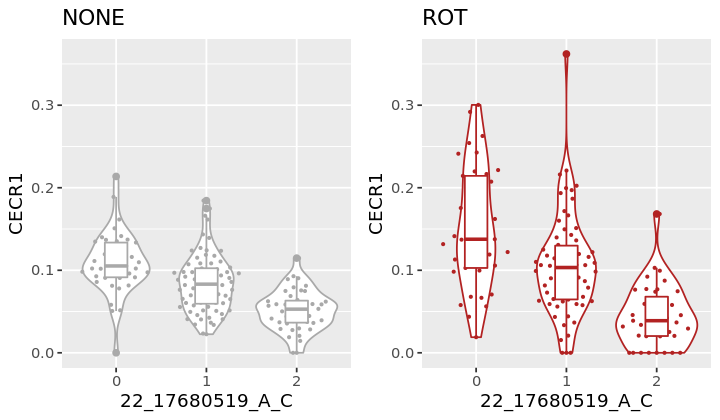

[1] 0.1079452 0.1447856
[1] "MARCH2"
[1] 0.1716220 0.1436966
[1] "SAMM50"


Warning message:
“Removed 9 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 9 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 9 rows containing missing values (position_quasirandom).”

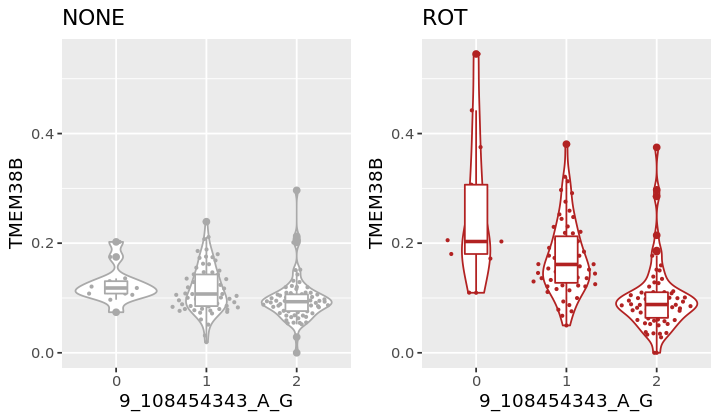

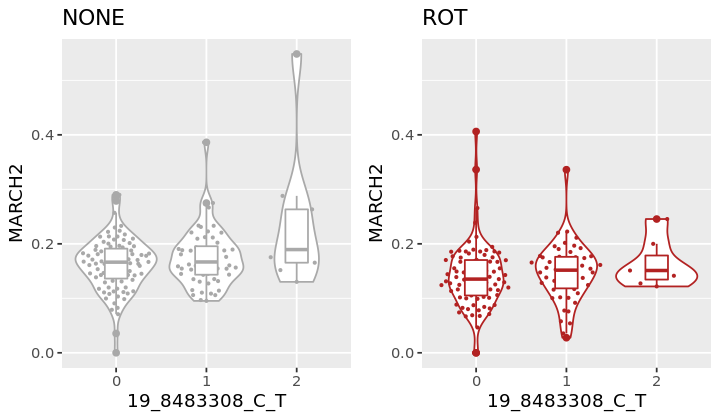

[1] 0.3445362 0.2983873
[1] "FAM118A"
[1] 0.09162200 0.06768378
[1] "GSKIP"


Warning message:
“Removed 3 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 3 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 3 rows containing missing values (position_quasirandom).”

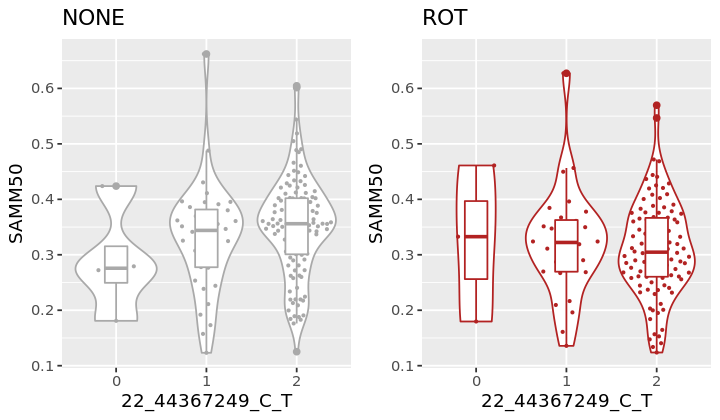

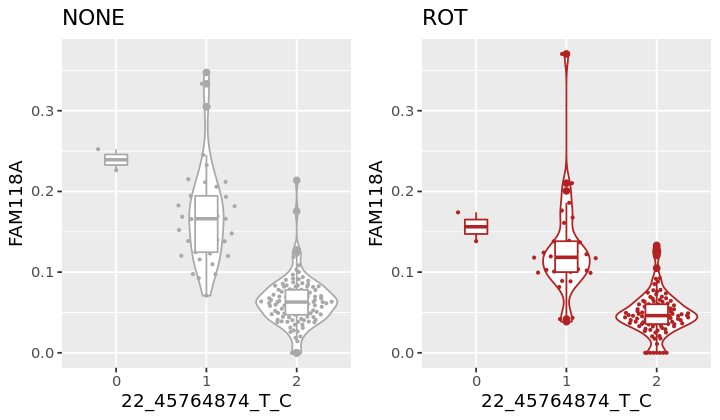

[1] 0.3193808 0.2901516
[1] "NINL"
[1] 0.07463919 0.08138878
[1] "POLR2I"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

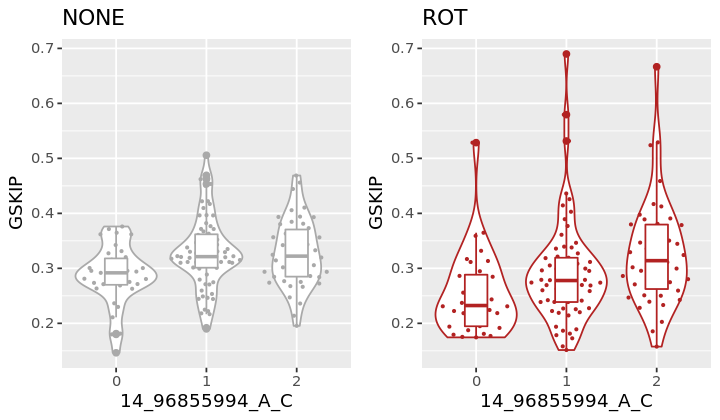

[1] 1.097391 1.064555
[1] "ZFR2"


Warning message:
“Removed 29 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 29 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 29 rows containing missing values (position_quasirandom).”

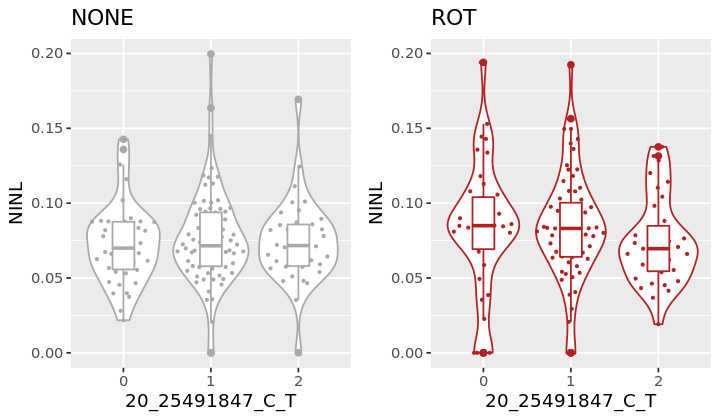

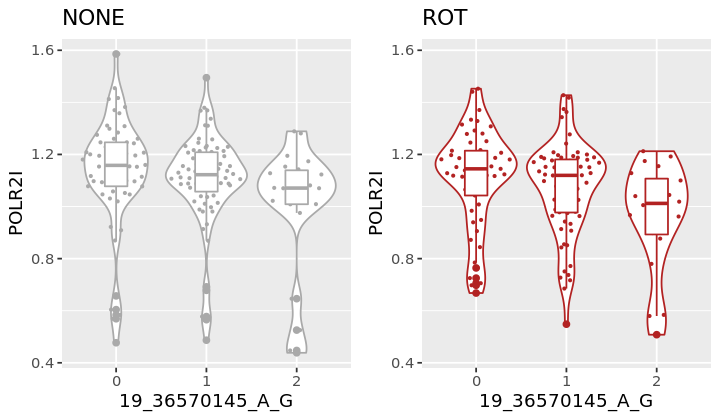

[1] 0.2871350 0.1338744
[1] "WNT3"
[1] 0.03688232 0.05510552
[1] "CHORDC1"


Warning message:
“Removed 13 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 13 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 13 rows containing missing values (position_quasirandom).”

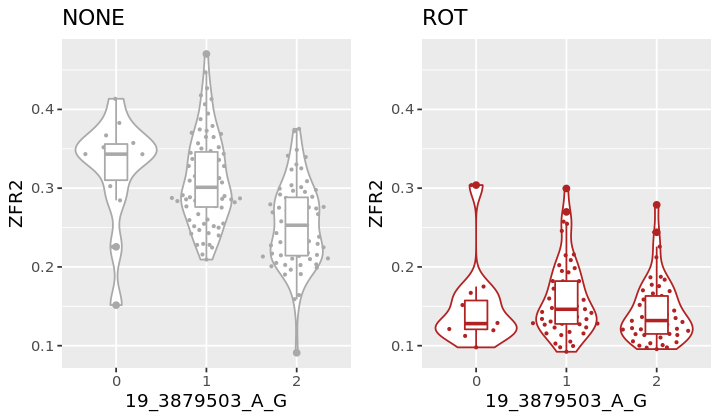

[1] 0.3732551 0.3153317
[1] "CARS"


Warning message:
“Removed 16 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 16 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 16 rows containing missing values (position_quasirandom).”

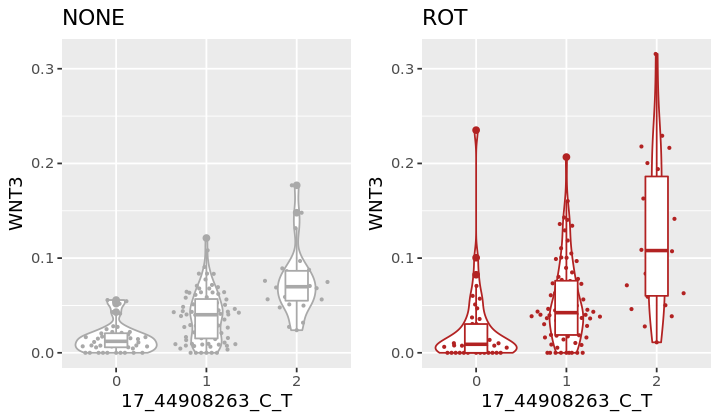

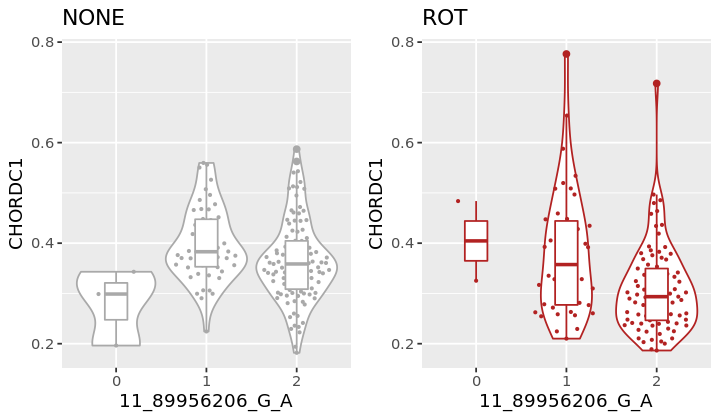

[1] 0.3557883 0.2866590
[1] "CAMKK2"
[1] 0.12944041 0.05904865
[1] "EBNA1BP2"


Warning message:
“Removed 46 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 46 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 46 rows containing missing values (position_quasirandom).”

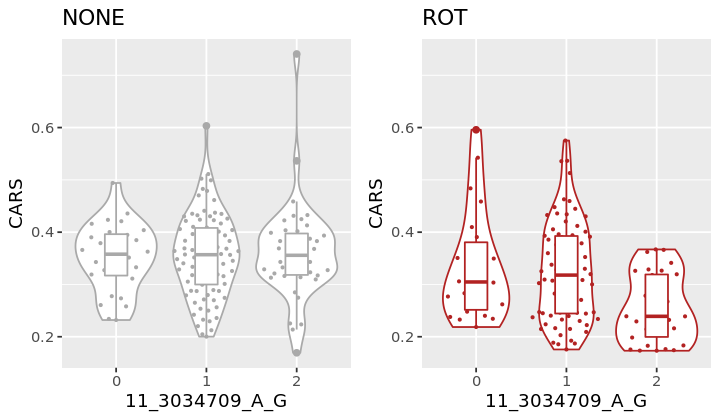

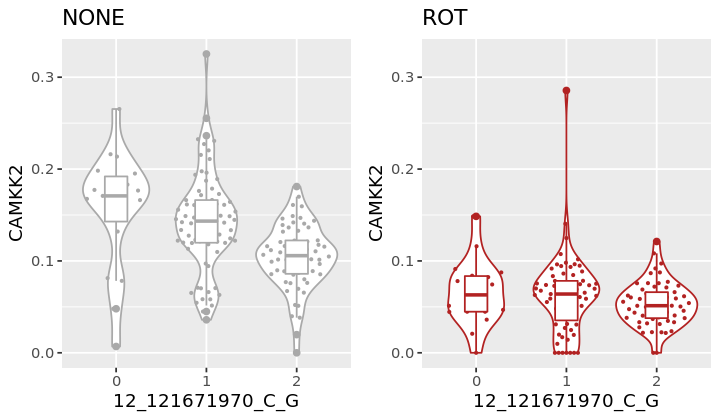

[1] 0.5791996 0.4176586
[1] "YIPF4"
[1] 0.3738122 0.3040118
[1] "KANSL1"


Warning message:
“Removed 12 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 12 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 12 rows containing missing values (position_quasirandom).”

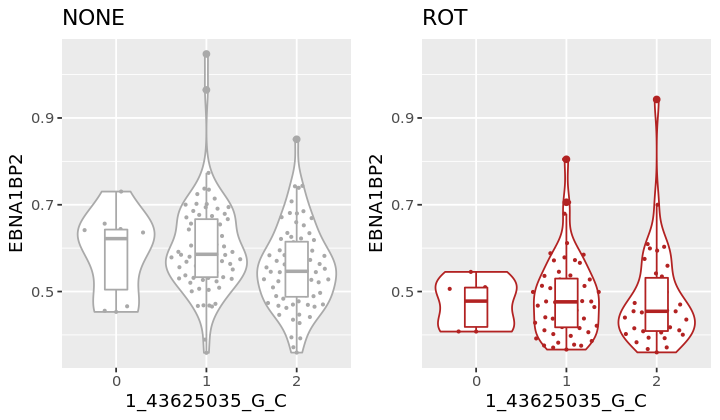

[1] 0.12225851 0.07996029
[1] "CHN1"


Warning message:
“Removed 14 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 14 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 14 rows containing missing values (position_quasirandom).”

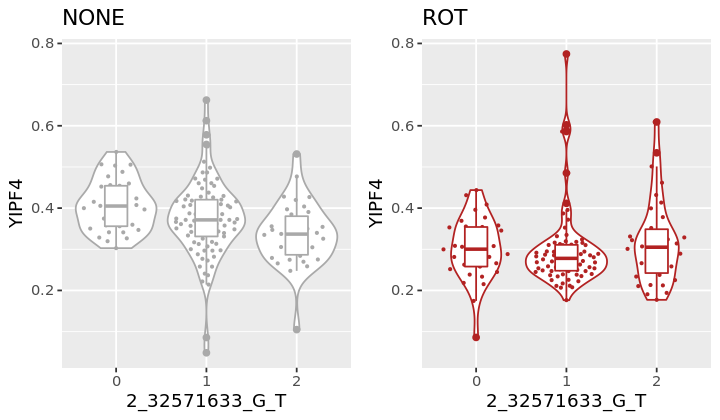

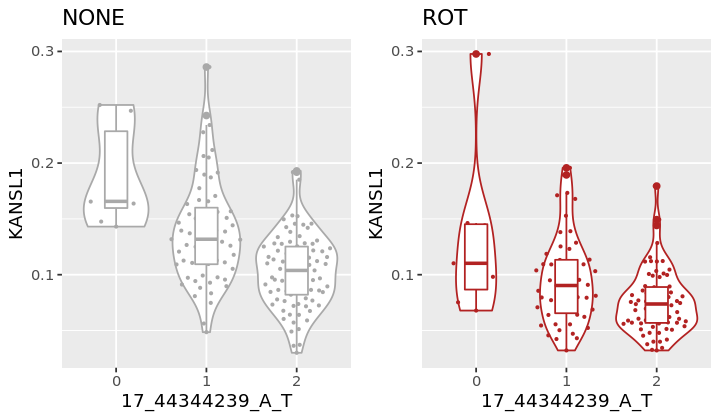

[1] 0.3777657 0.2972437
[1] "DTD2"
[1] 0.07978572 0.04094810
[1] "F12"


Warning message:
“Removed 9 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 9 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 9 rows containing missing values (position_quasirandom).”

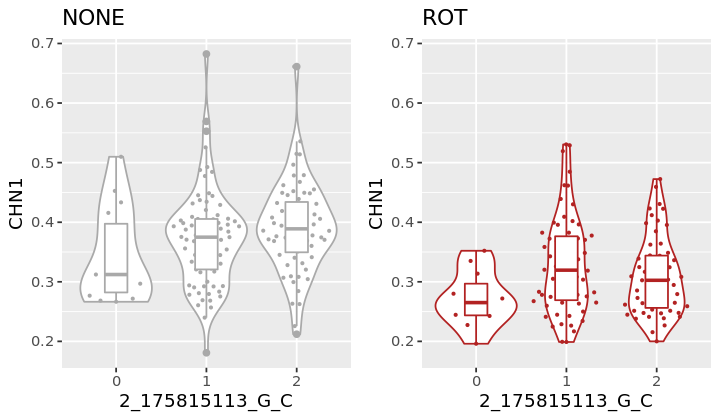

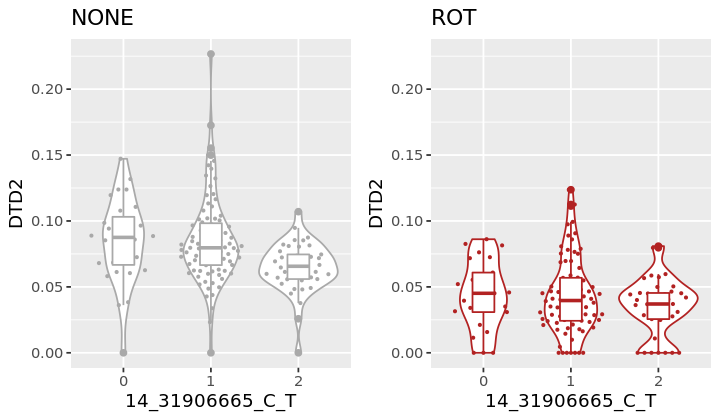

[1] 0.2597079 0.1687648
[1] "ABHD12B"
[1] 0.02172081 0.00929091
[1] "TIMM10"


Warning message:
“Removed 4 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 4 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 4 rows containing missing values (position_quasirandom).”

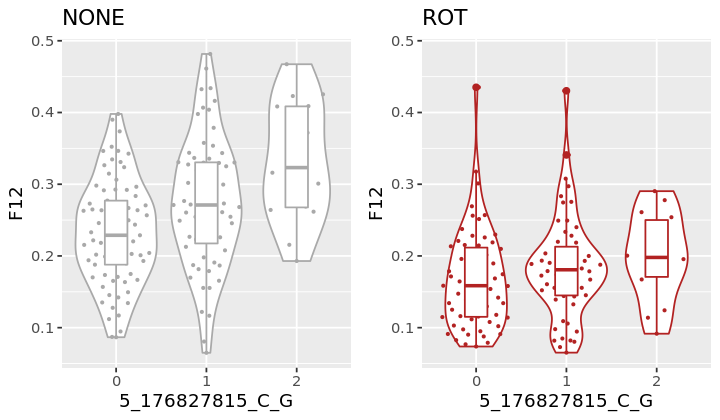

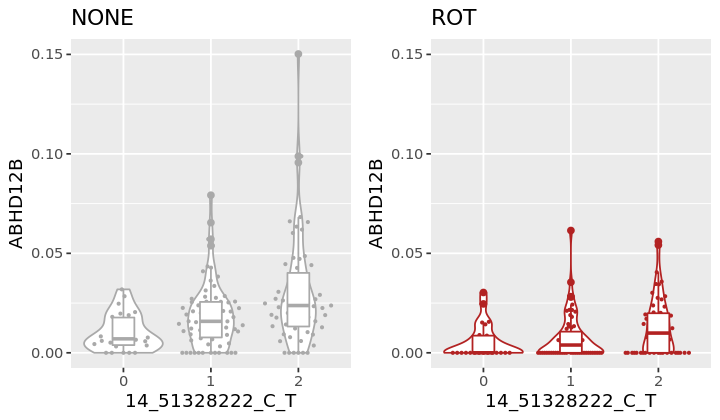

[1] 0.3076292 0.2988224
[1] "KIAA0513"


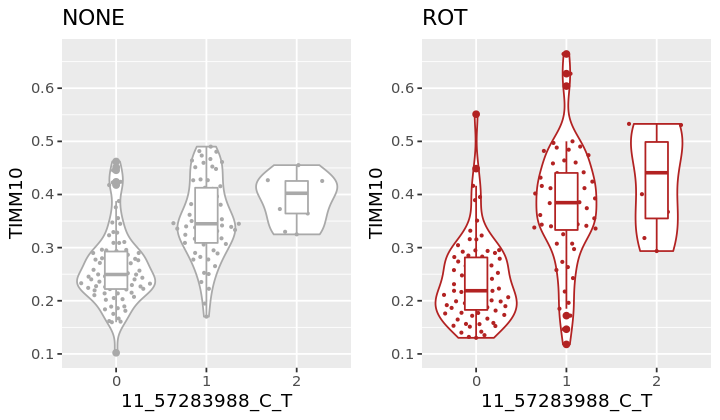

[1] 0.1403634 0.1169071
[1] "NEK3"
[1] 0.07571516 0.08370004
[1] "CBWD2"


Warning message:
“Removed 14 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 14 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 14 rows containing missing values (position_quasirandom).”

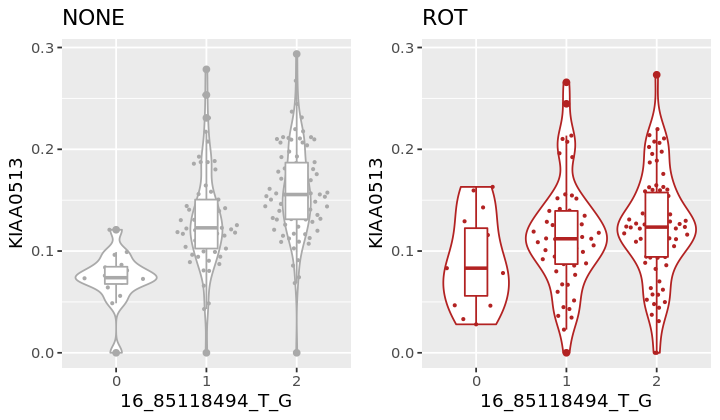

[1] 0.13405038 0.09070066
[1] "PRPF4"


Warning message:
“Removed 8 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 8 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 8 rows containing missing values (position_quasirandom).”

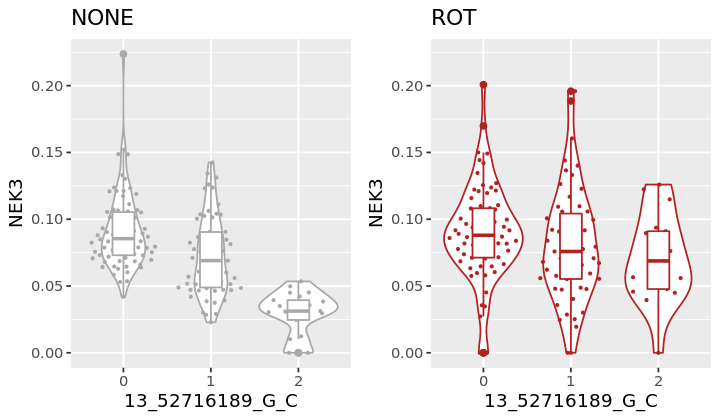

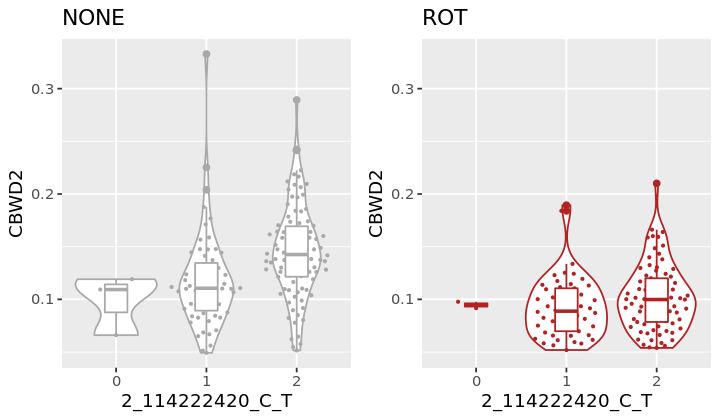

[1] 0.1776500 0.1668409
[1] "CNOT6L"
[1] 0.113887 0.102110
[1] "EML4"


Warning message:
“Removed 3 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 3 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 3 rows containing missing values (position_quasirandom).”

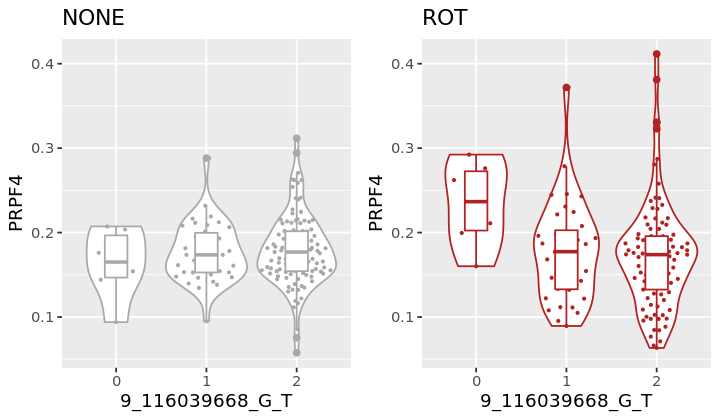

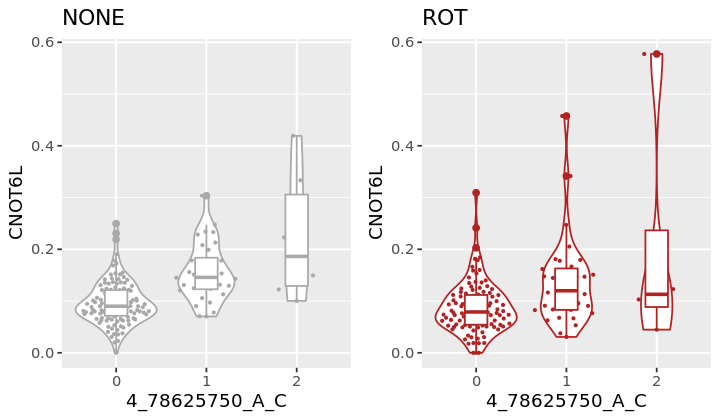

[1] 0.1384300 0.1414409
[1] "PHOSPHO2"


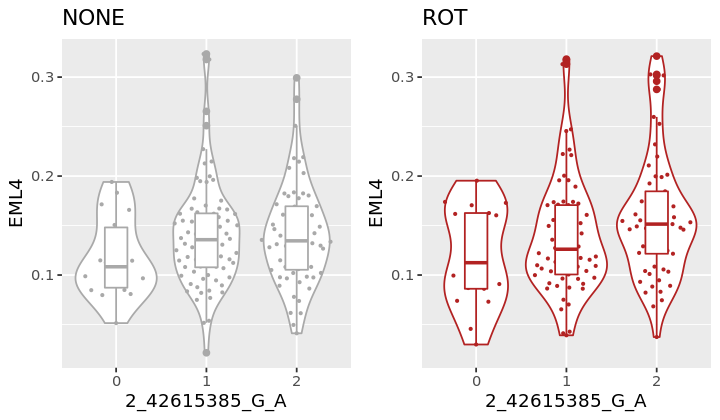

[1] 0.07298498 0.02875021
[1] "TAMM41"
[1] 0.08434420 0.06582208
[1] "PAM"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

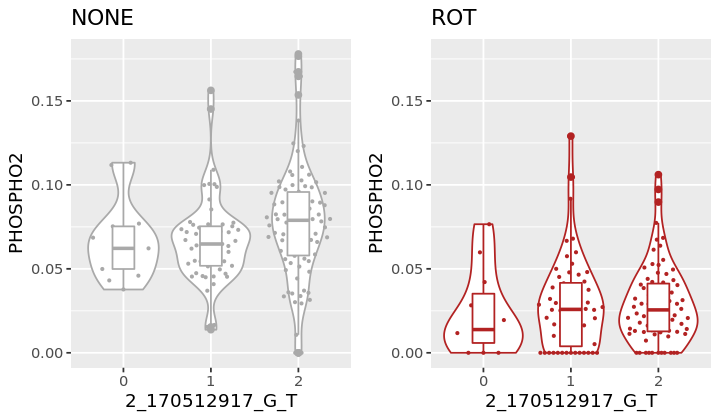

[1] 0.7560258 0.7303045


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

[1] "GTF2H2" "NAIP"  


Warning message:
“Removed 2 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (position_quasirandom).”

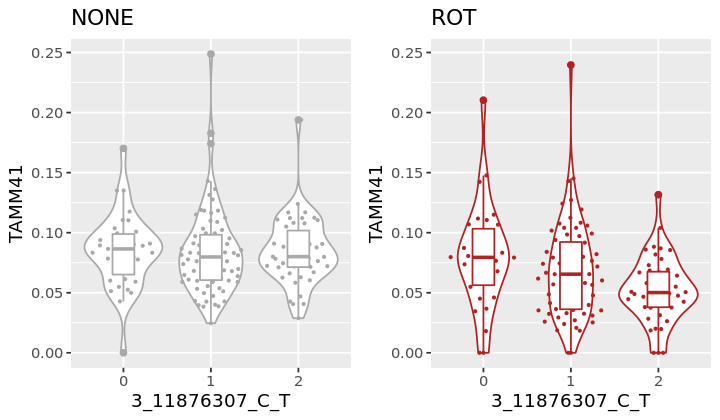

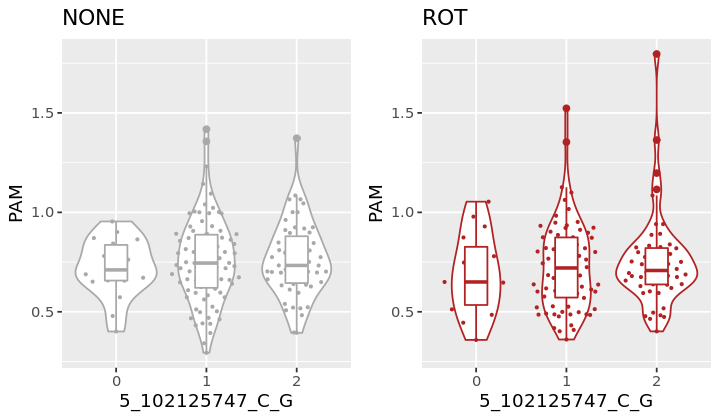

[1] 0.2054317 0.2658328
[1] "CCZ1B"
[1] 0.1146781 0.0849461
[1] "CEP78"


Warning message:
“Removed 6 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 6 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 6 rows containing missing values (position_quasirandom).”

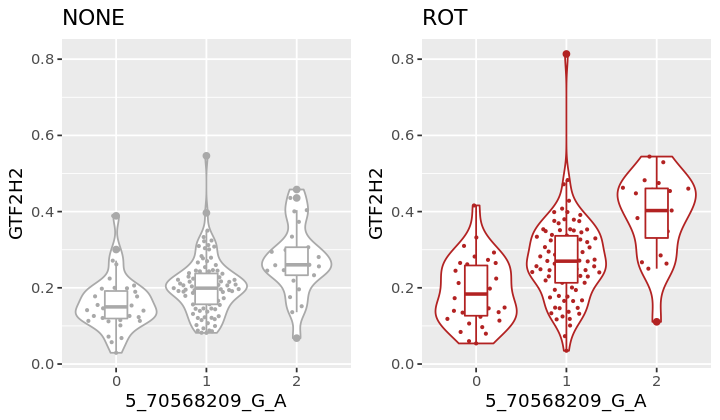

[1] 0.14811613 0.09563896
[1] "APIP"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

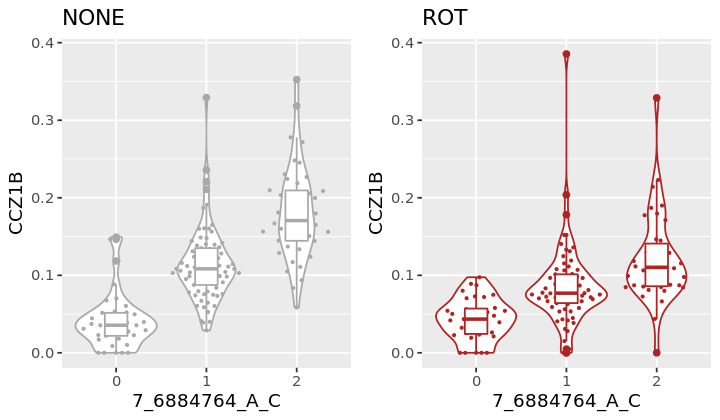

[1] 0.1567887 0.1273498
[1] "ELMSAN1"


Warning message:
“Removed 7 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 7 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 7 rows containing missing values (position_quasirandom).”

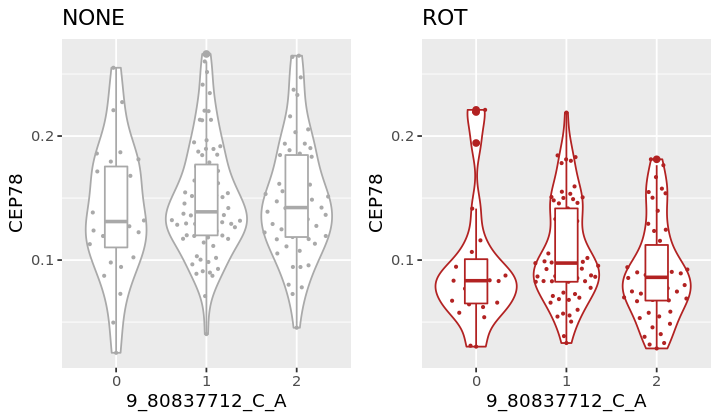

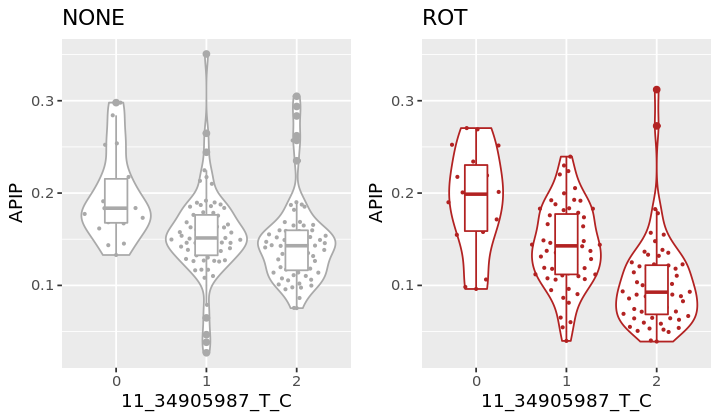

[1] 0.1042114 0.0882453
[1] "N6AMT1"


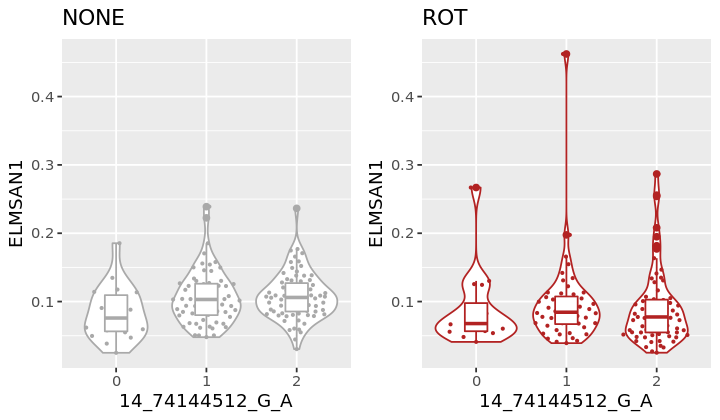

[1] 0.05099361 0.07826968
[1] "LCA5L"
[1] 0.01144062 0.00592945
[1] "ATP5G1"


Warning message:
“Removed 4 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 4 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 4 rows containing missing values (position_quasirandom).”

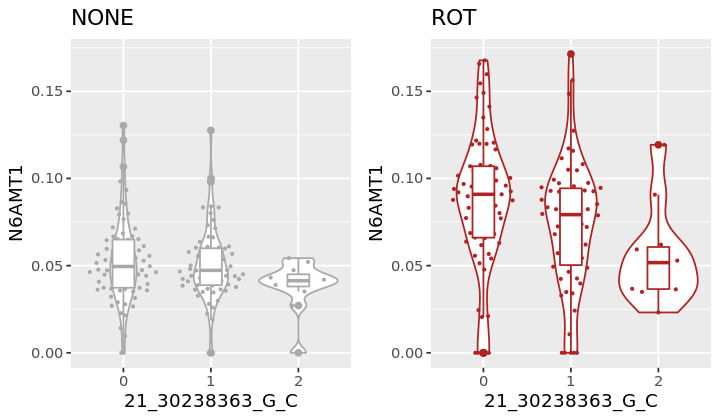

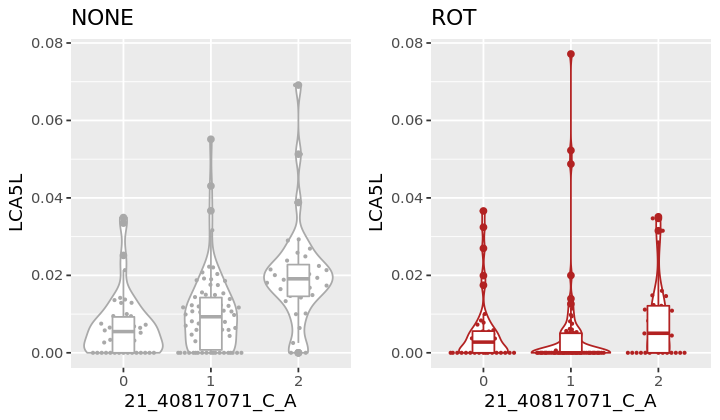

[1] 1.433293 1.352074
[1] "NEK8"
[1] 0.02190896 0.01908423
[1] "C5orf45"


Warning message:
“Removed 5 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 5 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 5 rows containing missing values (position_quasirandom).”

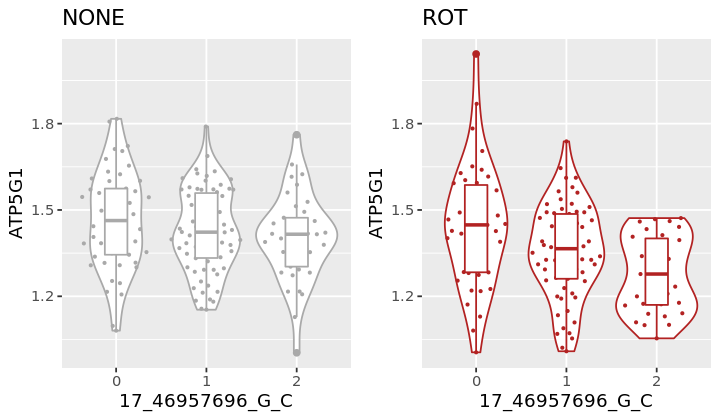

[1] 0.3088536 0.2195374
[1] "SQSTM1"


Warning message:
“Removed 4 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 4 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 4 rows containing missing values (position_quasirandom).”

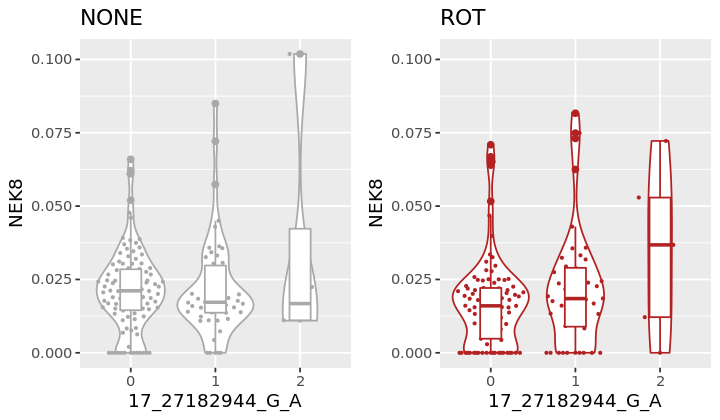

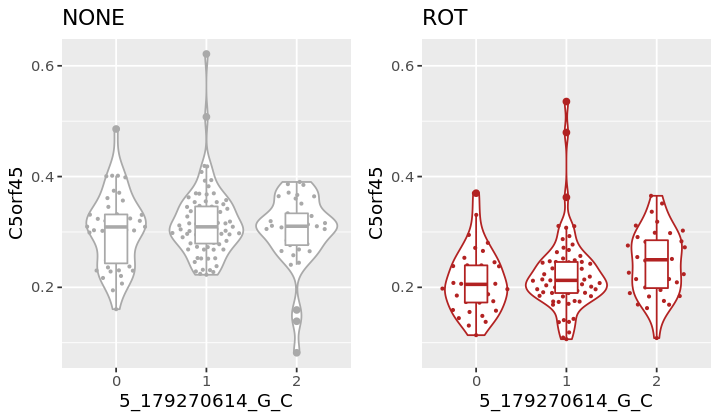

[1] 0.5272511 0.4804449
[1] "SLC22A15"
[1] 0.05309082 0.05467463
[1] "ARPC2"


Warning message:
“Removed 38 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 38 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 38 rows containing missing values (position_quasirandom).”

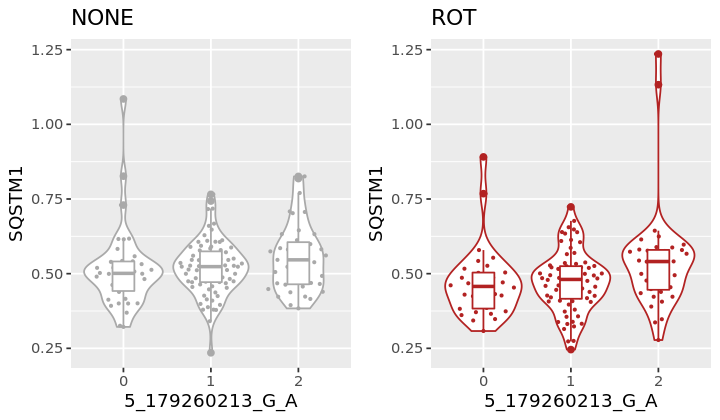

[1] 1.743350 1.497394
[1] "C1orf50"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

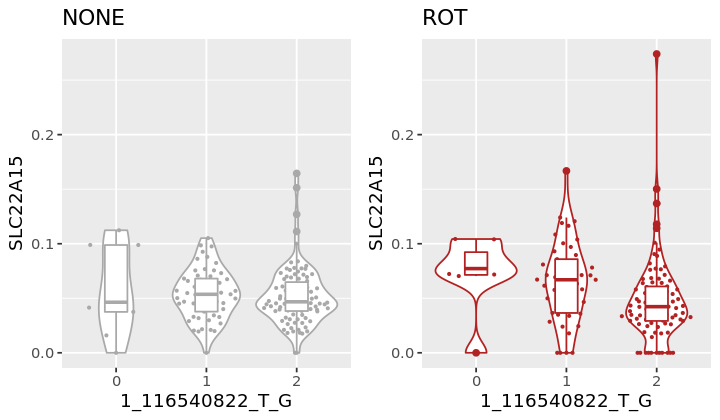

[1] 0.3016635 0.2697135
[1] "LSM6"


Warning message:
“Removed 6 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 6 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 6 rows containing missing values (position_quasirandom).”

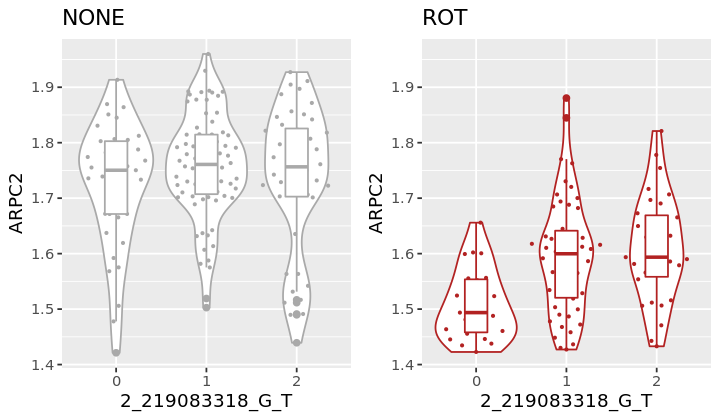

[1] 0.4753817 0.4415211
[1] "SUN1"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

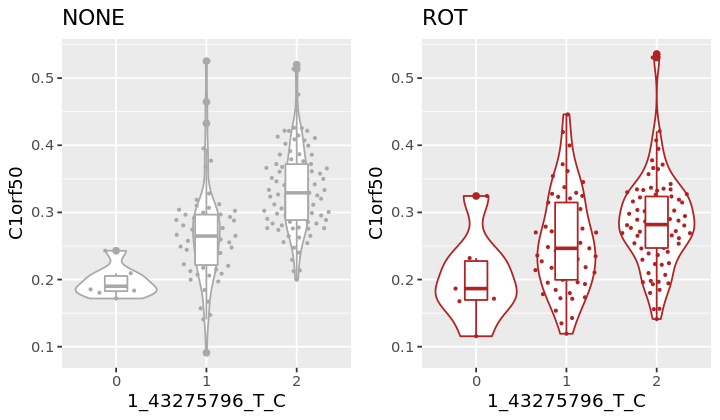

[1] 0.1881219 0.2264550


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

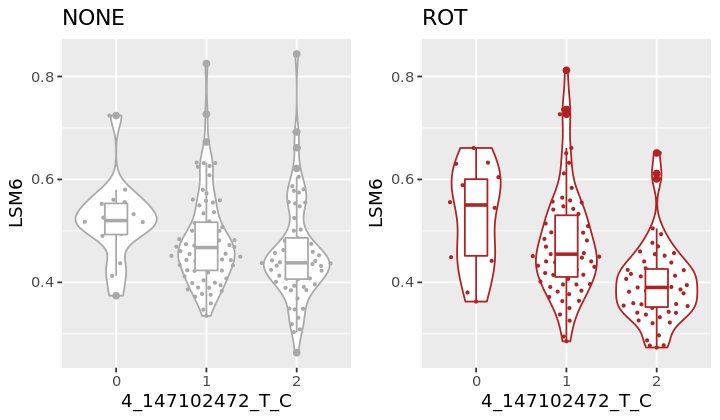

[1] "SLC18A2" "PDZD8"  


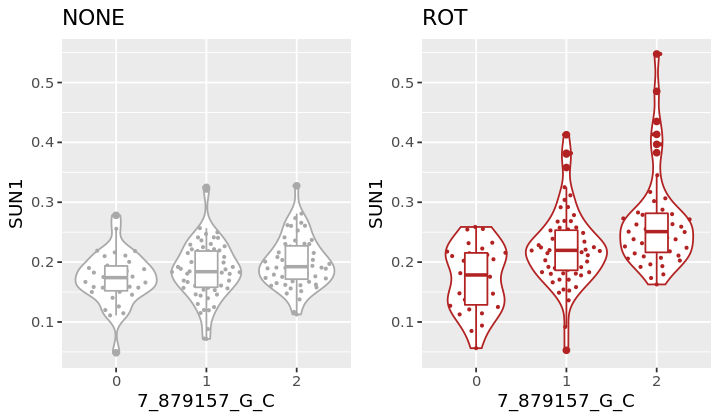

[1] 0.05487649 0.08645959
[1] "STK32C"
[1] 0.1752591 0.1817449
[1] "IKBIP"


Warning message:
“Removed 46 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 46 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 46 rows containing missing values (position_quasirandom).”

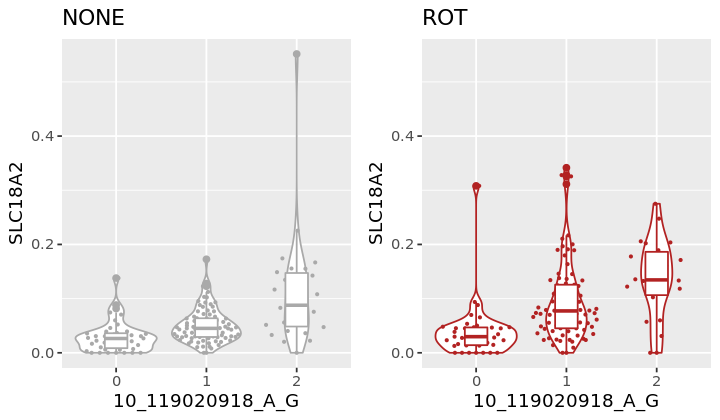

[1] 0.10494983 0.03039375
[1] "SRR"


Warning message:
“Removed 32 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 32 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 32 rows containing missing values (position_quasirandom).”

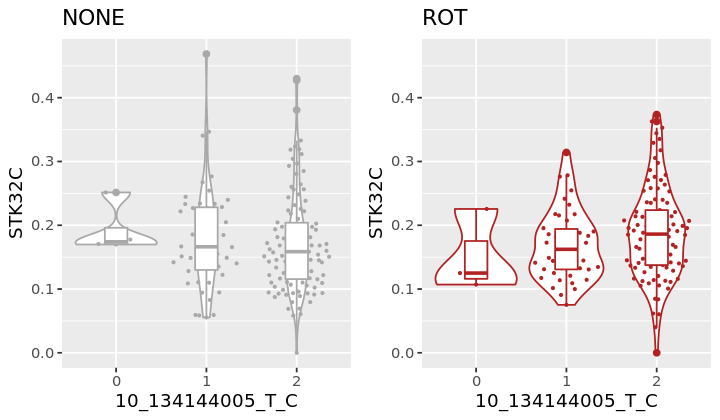

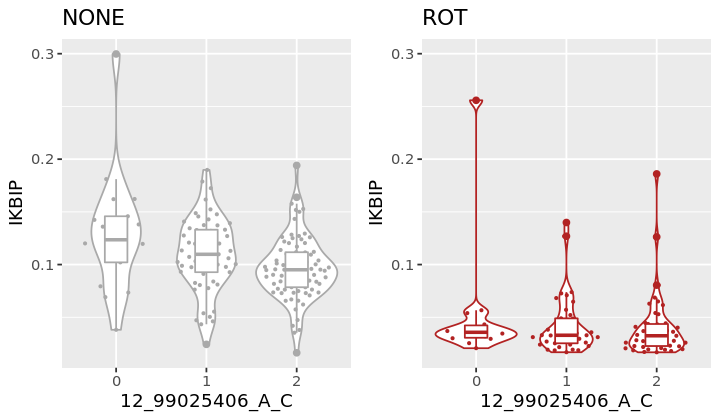

[1] 0.2270308 0.1197413
[1] "PXK"
[1] 0.1542312 0.1262699
[1] "ARF4"


Warning message:
“Removed 2 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (position_quasirandom).”

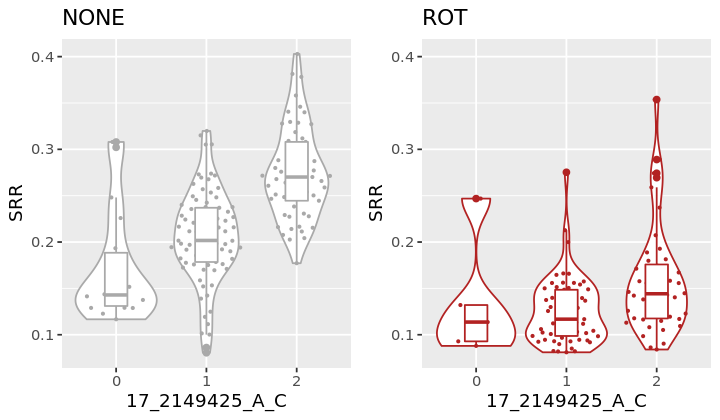

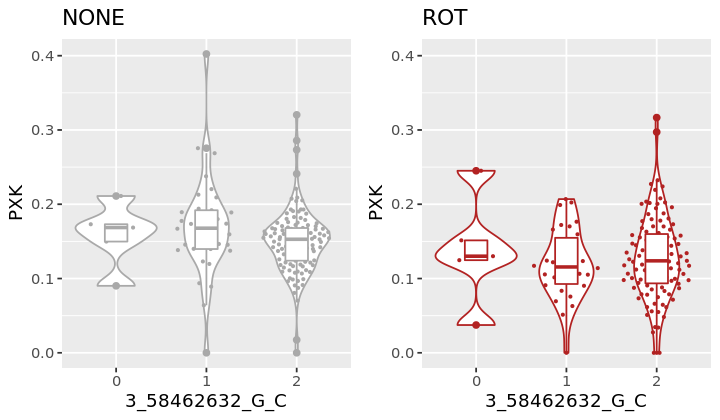

[1] 1.223496 1.252712
[1] "RPS9"


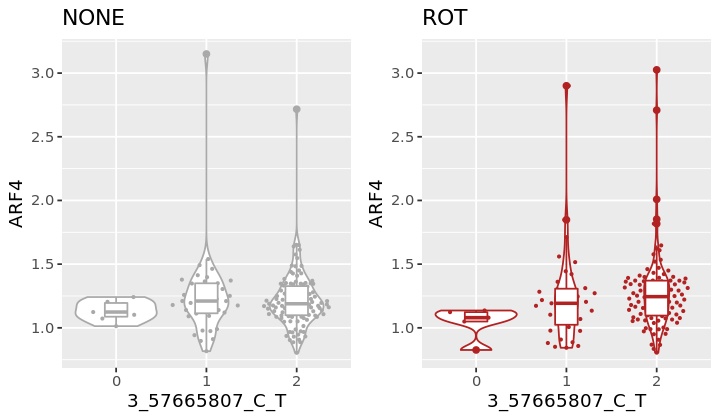

[1] 2.218475 2.205255
[1] "C11orf24"


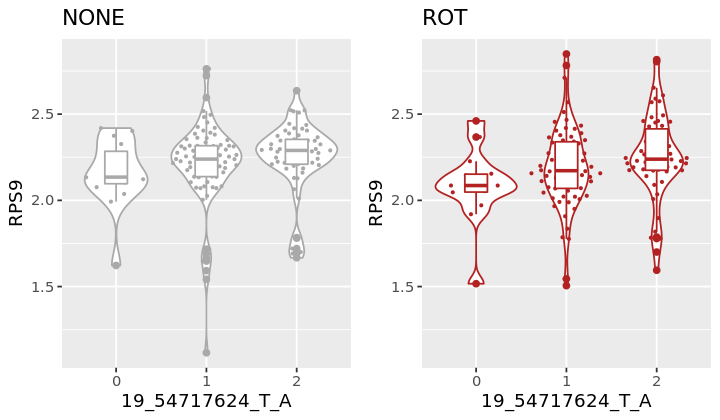

[1] 0.08888244 0.06413885
[1] "C5orf34"


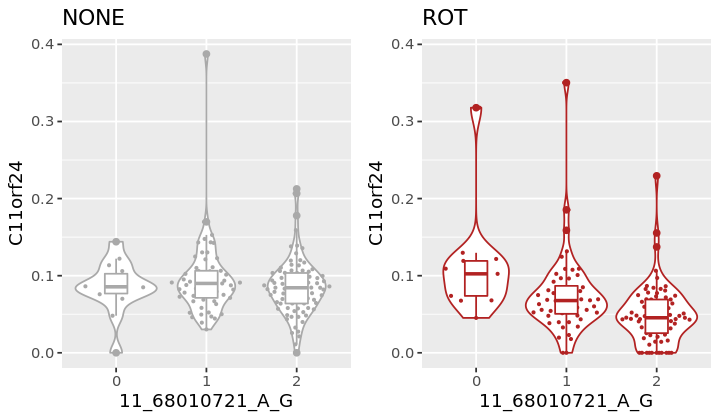

[1] 0.007412012 0.045603004
[1] "TMEM80"


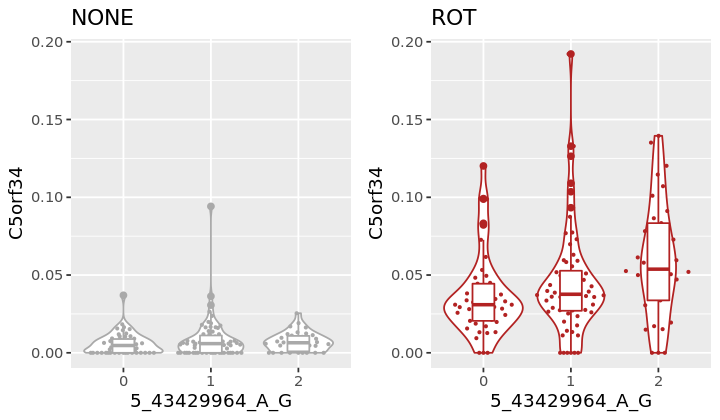

[1] 0.16101491 0.07790269
[1] "PNPLA2"
[1] 0.06708457 0.05422235
[1] "EFCAB4A"


Warning message:
“Removed 3 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 3 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 3 rows containing missing values (position_quasirandom).”

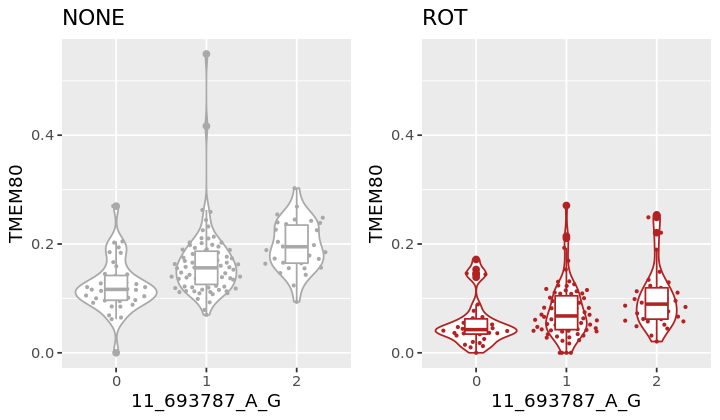

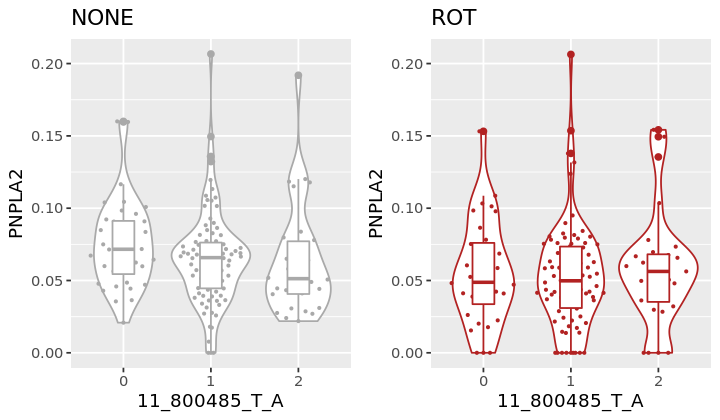

[1] 0.1460295 0.1853554
[1] "ZNF114"


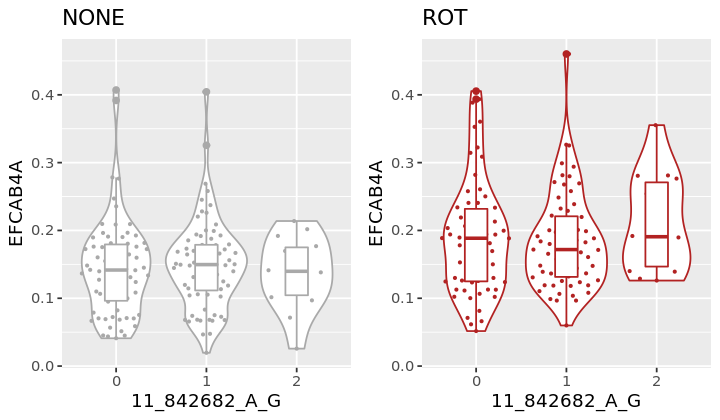

[1] 0.03722704 0.01442498
[1] "ZNF552"
[1] 0.02802992 0.01354823
[1] "FAHD1"


Warning message:
“Removed 26 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 26 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 26 rows containing missing values (position_quasirandom).”

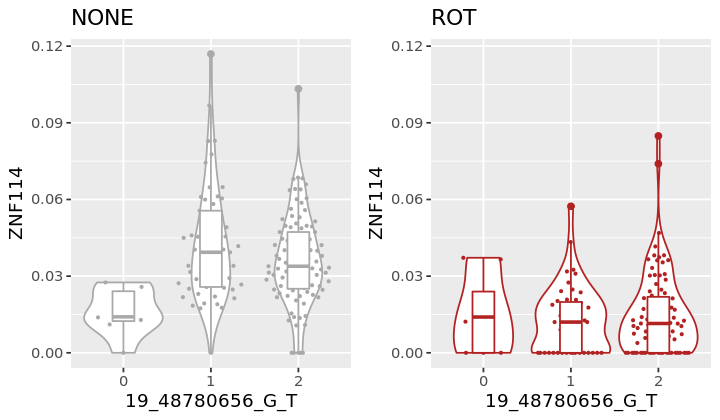

[1] 0.22797936 0.09954959
[1] "LSM10"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

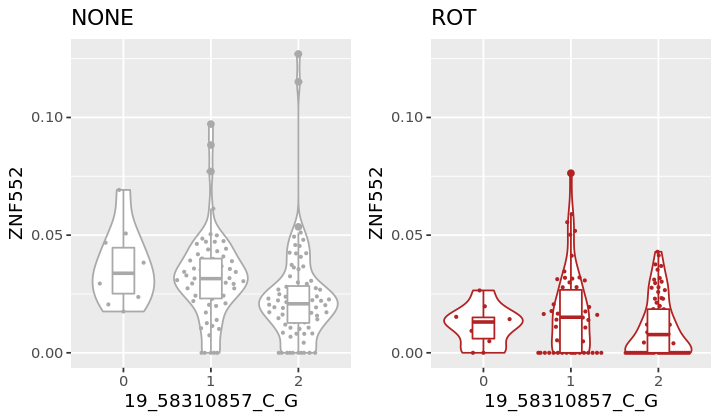

[1] 0.5789886 0.5866868
[1] "YBEY"


Warning message:
“Removed 3 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 3 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 3 rows containing missing values (position_quasirandom).”

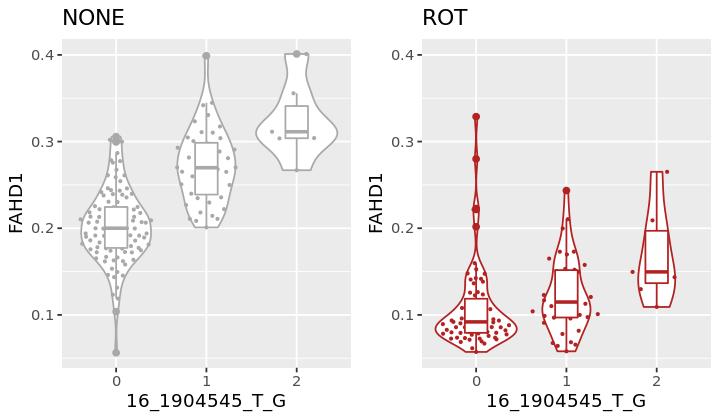

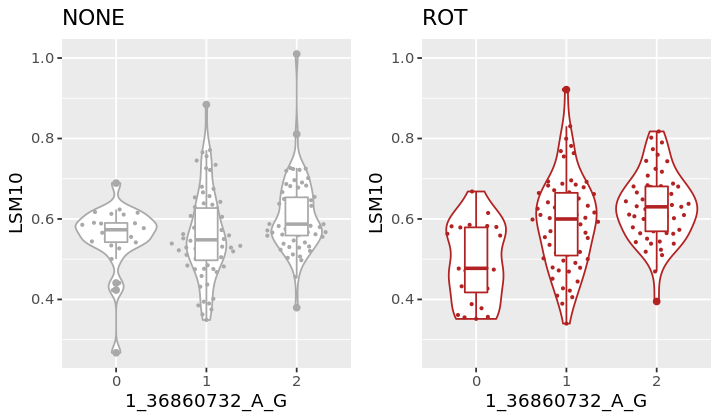

[1] 0.2087508 0.2095003
[1] "SMDT1"


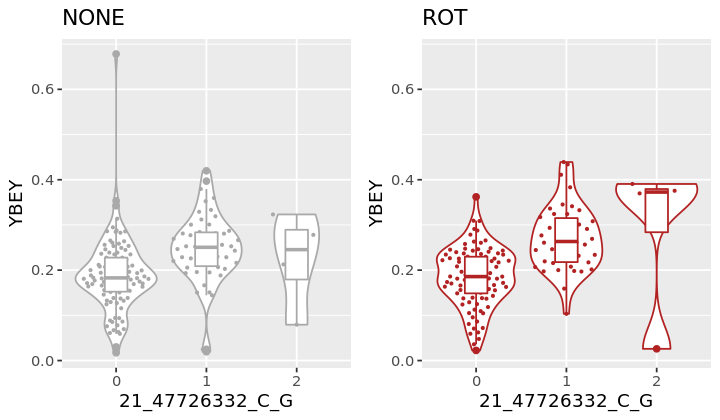

[1] 1.162856 1.111745
[1] "DAZAP2"
[1] 0.2938217 0.4185628
[1] "NUDT14"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

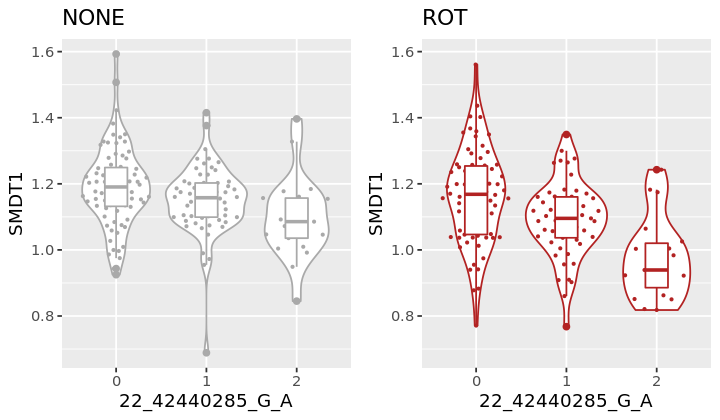

[1] 0.4616539 0.4367224
[1] "TTC32"


Warning message:
“Removed 9 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 9 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 9 rows containing missing values (position_quasirandom).”

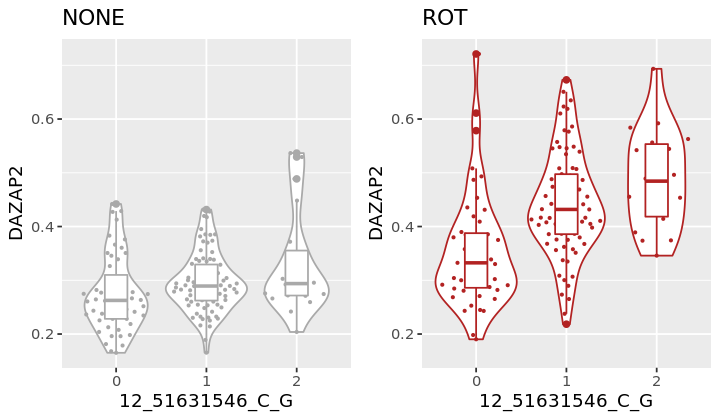

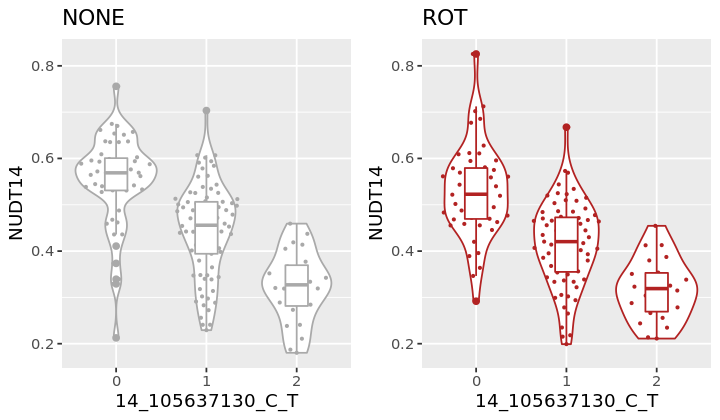

[1] 0.14501425 0.07747874
[1] "SIGIRR"
[1] 0.1974238 0.1615708
[1] "PIGP"


Warning message:
“Removed 20 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 20 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 20 rows containing missing values (position_quasirandom).”

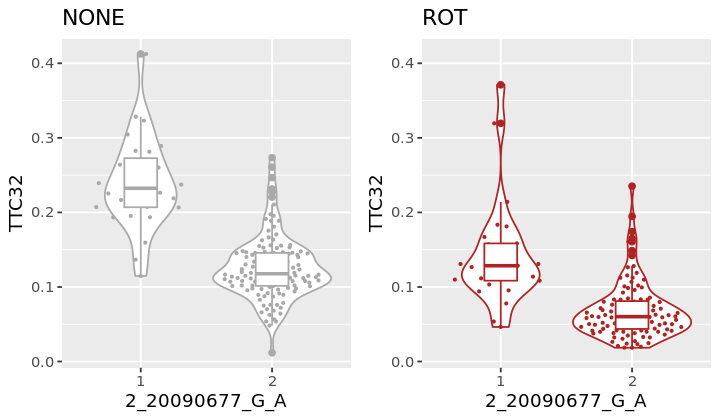

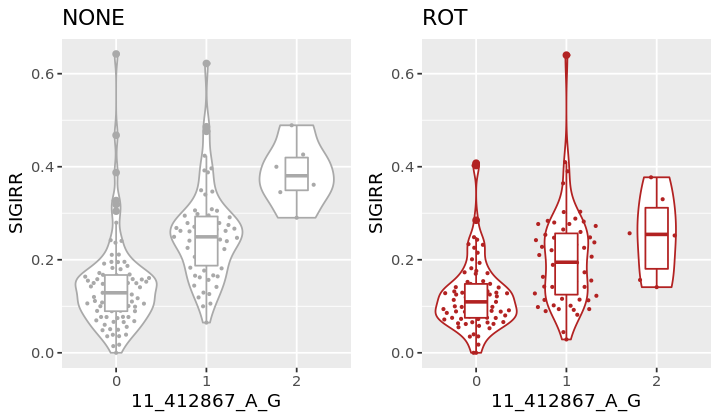

[1] 0.4539319 0.3087976
[1] "XPNPEP3"


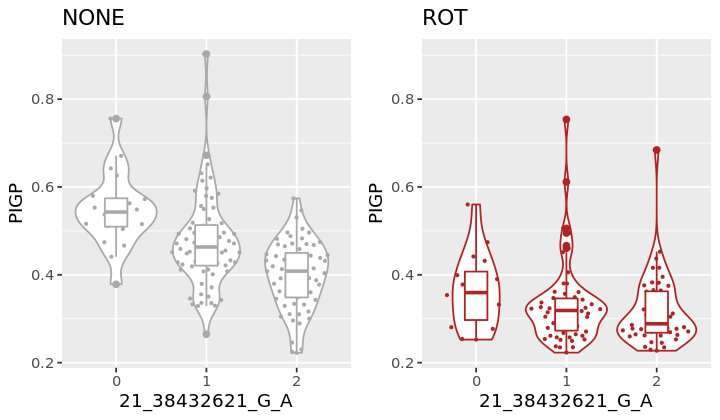

[1] 0.05593555 0.05272868
[1] "ZNF786"
[1] 0.07510638 0.03109013


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

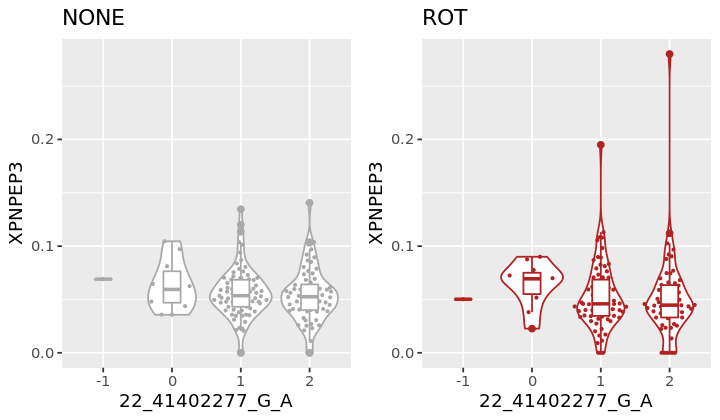

[1] "RPL41"
[1] 3.311843 3.514020
[1] "MBP"


Warning message:
“Removed 20 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 20 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 20 rows containing missing values (position_quasirandom).”

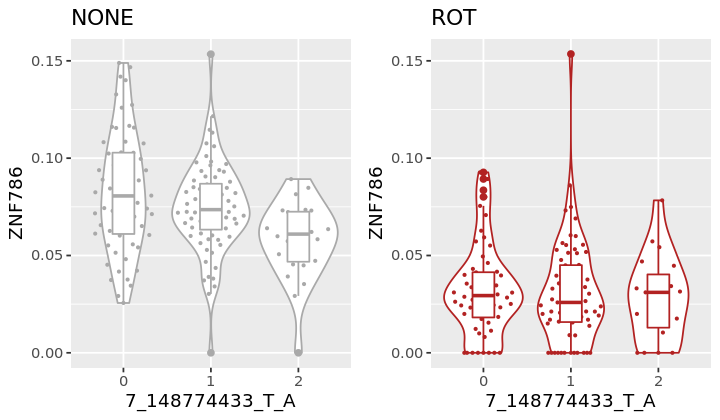

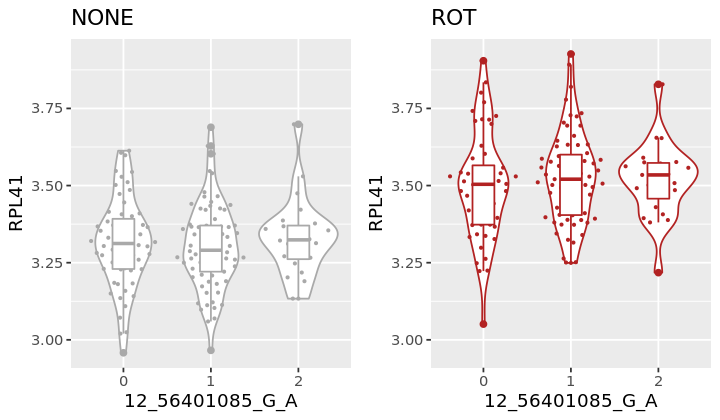

[1] 0.3670991 0.2234982
[1] "GFPT1"
[1] 0.3086736 0.3398199
[1] "RPL10A"


Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

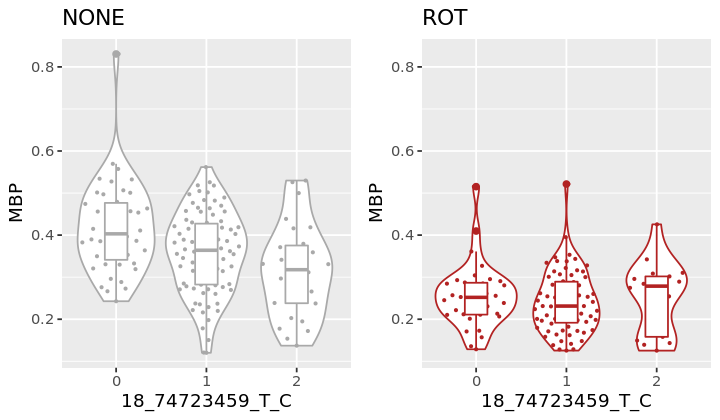

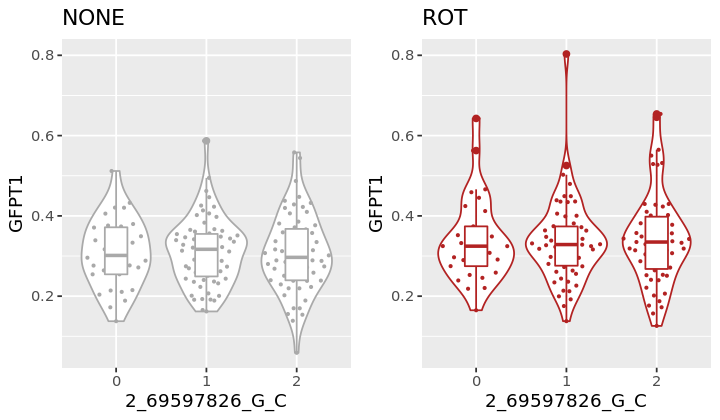

[1] 2.236042 2.331248
[1] "CCDC167"
[1] 0.8886461 0.9629587
[1] "KLHL23"


Warning message:
“Removed 12 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 12 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 12 rows containing missing values (position_quasirandom).”

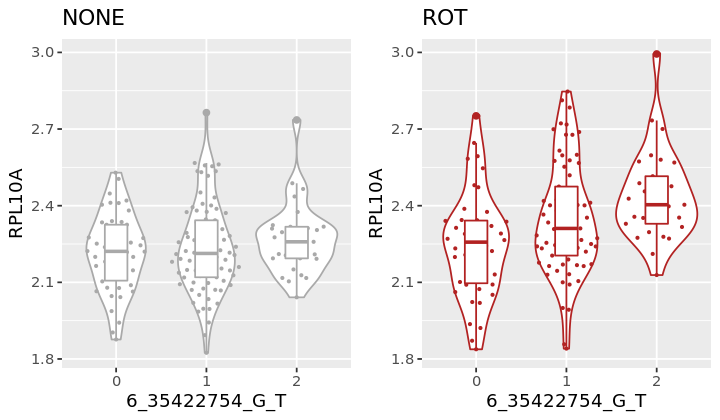

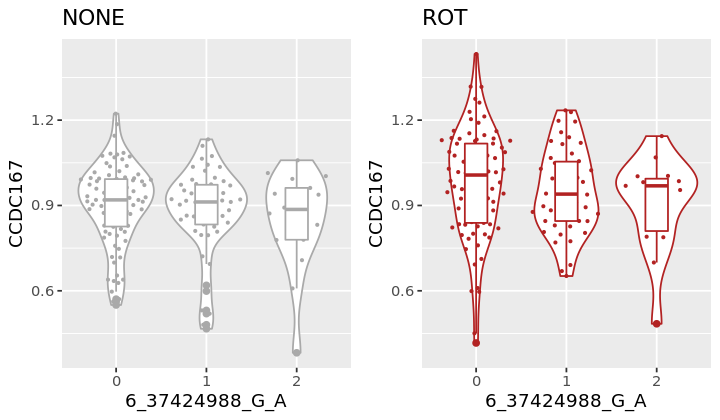

[1] 0.3908161 0.2564035
[1] "SLC35E2"


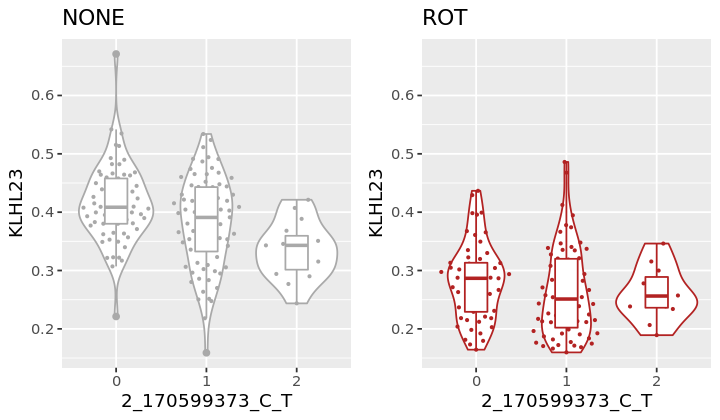

[1] 0.06328501 0.03119032
[1] "EXOSC6"


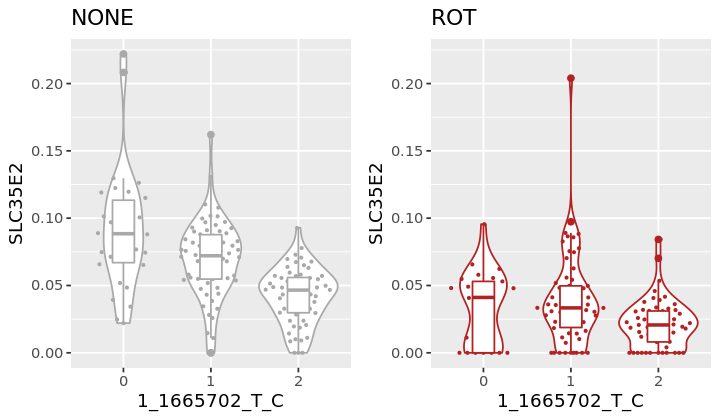

[1] 0.04257344 0.04832641
[1] "DHFR"
[1] 0.05510317 0.01567347
[1] "C7orf73"


Warning message:
“Removed 3 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 3 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 3 rows containing missing values (position_quasirandom).”

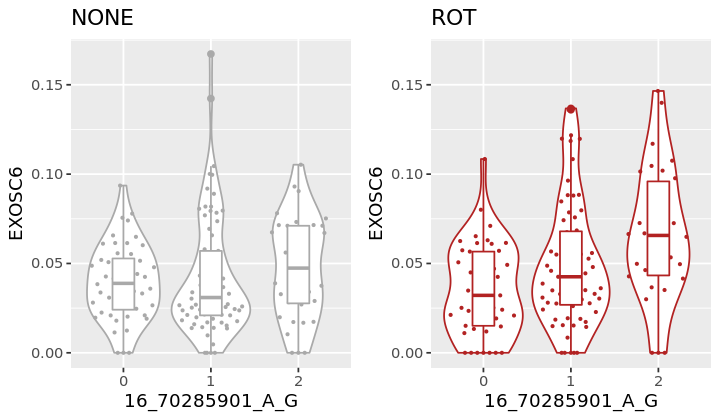

[1] 0.8425954 0.8686337


Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

[1] "GTF2H2" "NAIP"  


Warning message:
“Removed 2 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (position_quasirandom).”

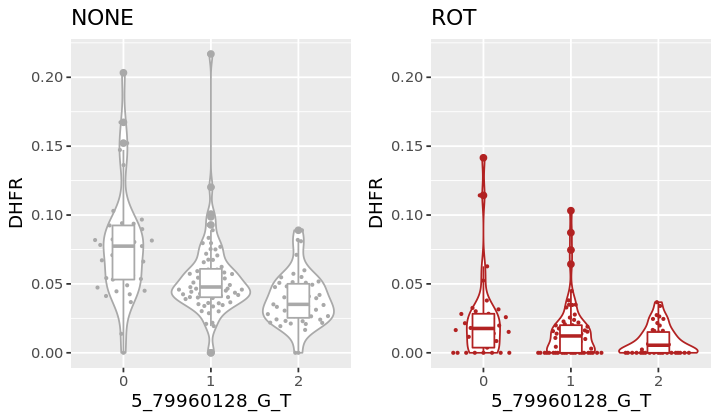

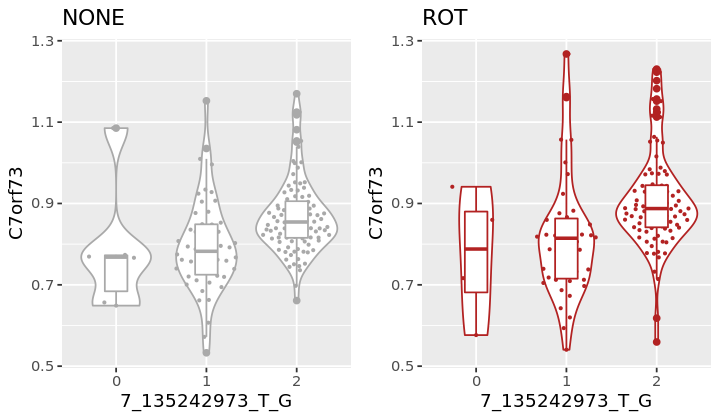

[1] 0.2054317 0.2658328
[1] "TRNP1"


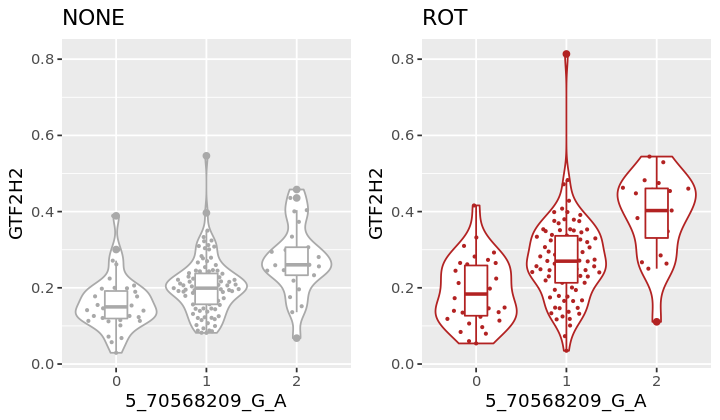

[1] 0.08455633 0.07345505


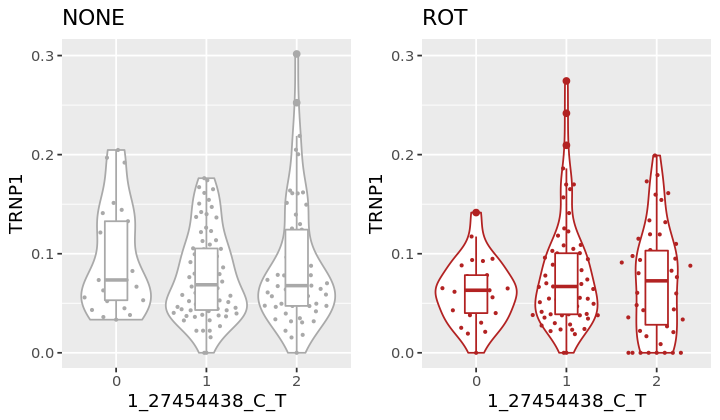

In [11]:
for (i in 1:length(snps)){
#     print(i)
    snp = as.character(snps[i])
#     print(snp)
    gene = as.character(int_DA[int_DA$snp_id == snp,"feature_id"])
#     print(gene)
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    print(gene_name)
    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    e1 = e_noROT[,c("donor_id",gene_name)]
    e1$donor_id = as.character(e1$donor_id)
    df1 = inner_join(e1,g,by = "donor_id")
    colnames(df1)[2] = "gene"
    df1$genotypes <- round(df1$dosages)
#     print(head(df1,2))
    e2 = e_ROT[,c("donor_id",gene_name)]
    e2$donor_id = as.character(e2$donor_id)
    df2 = inner_join(e2,g,by = "donor_id")
    colnames(df2)[2] = "gene"
    df2$genotypes <- round(df2$dosages)
#     print(head(df2,2))   
    m = min(min(df1$gene),min(df1$gene))
    M = max(max(df1$gene),max(df2$gene))
    p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin(col = col_NONE) + 
                xlab(snp) + ylab(gene_name) +  geom_quasirandom(size = 0.5, col = col_NONE) + 
                geom_boxplot(width = 0.25, col = col_NONE) + ylim(c(m,M)) + ggtitle("NONE")
    p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin(col = col_ROT) + 
                xlab(snp) + ylab(gene_name) + geom_quasirandom(size = 0.5, col = col_ROT) + 
                geom_boxplot(width = 0.25, col = col_ROT) + ylim(c(m,M)) +  ggtitle("ROT")
    options(repr.plot.width=6, repr.plot.height=3.5)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
    print(c(mean(df1$gene),mean(df2$gene)))
}

In [ ]:
####### alternative visualisation

In [363]:
e = "/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/pool1_17_D52/qtl_analysis/eqtl_discovery/celltype_DA/treatment_interaction_test_ncellfilter_top_qtl_results_all/phenotypes.tsv"
cov = "/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/pool1_17_D52/qtl_analysis/eqtl_discovery/celltype_DA/treatment_interaction_test_ncellfilter_top_qtl_results_all/covariates.tsv"

In [ ]:
e = read.csv(e,sep='\t')
cov = read.csv(cov,sep='\t')

In [364]:
head(e,2)
rownames(e) <- e$ensembl_gene_id
e$ensembl_gene_id <- c()
head(e,2)
head(cov,2)

ensembl_gene_id,HPSI0114i.eipl_1_NONE,HPSI0114i.kolf_2_NONE,HPSI0114i.kolf_2_ROT,HPSI0114i.wegi_1_NONE,HPSI0114i.wegi_1_ROT,HPSI0114i.zapk_2_NONE,HPSI0114i.zapk_2_ROT,HPSI0115i.aion_2_NONE,HPSI0115i.aion_2_ROT,⋯,HPSI1113i.hayt_3_ROT,HPSI1113i.podx_1_NONE,HPSI1113i.podx_1_ROT,HPSI1113i.qolg_1_NONE,HPSI1113i.qorq_1_NONE,HPSI1113i.vuud_2_NONE,HPSI1114i.kuul_1_NONE,HPSI1114i.kuul_1_ROT,HPSI1213i.hehd_1_NONE,HPSI1213i.hehd_1_ROT
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000261657,0.17044125,0.21083756,0.285816759,0.166892022,0.20114891,0.17229497,0.248629078,0.16879657,0.270660490,⋯,0.204729170,0.13290532,0.1365161,0.16675195,0.18057172,0.15808788,0.167752370,0.2331936,0.21874736,0.25479755
ENSG00000227640,0.02013723,0.01023038,0.005657432,0.008979948,0.02308847,0.01373522,0.005451627,0.02058246,0.004868957,⋯,0.005811211,0.01236245,0.0107492,0.02893848,0.09683002,0.01886671,0.006268752,0.0000000,0.03159874,0.03097888


,HPSI0114i.eipl_1_NONE,HPSI0114i.kolf_2_NONE,HPSI0114i.kolf_2_ROT,HPSI0114i.wegi_1_NONE,HPSI0114i.wegi_1_ROT,HPSI0114i.zapk_2_NONE,HPSI0114i.zapk_2_ROT,HPSI0115i.aion_2_NONE,HPSI0115i.aion_2_ROT,HPSI0115i.aoxv_1_NONE,⋯,HPSI1113i.hayt_3_ROT,HPSI1113i.podx_1_NONE,HPSI1113i.podx_1_ROT,HPSI1113i.qolg_1_NONE,HPSI1113i.qorq_1_NONE,HPSI1113i.vuud_2_NONE,HPSI1114i.kuul_1_NONE,HPSI1114i.kuul_1_ROT,HPSI1213i.hehd_1_NONE,HPSI1213i.hehd_1_ROT
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000261657,0.17044125,0.21083756,0.285816759,0.166892022,0.20114891,0.17229497,0.248629078,0.16879657,0.270660490,0.2008474,⋯,0.204729170,0.13290532,0.1365161,0.16675195,0.18057172,0.15808788,0.167752370,0.2331936,0.21874736,0.25479755
ENSG00000227640,0.02013723,0.01023038,0.005657432,0.008979948,0.02308847,0.01373522,0.005451627,0.02058246,0.004868957,0.0494296,⋯,0.005811211,0.01236245,0.0107492,0.02893848,0.09683002,0.01886671,0.006268752,0.0000000,0.03159874,0.03097888


index,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,treatment
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
HPSI0114i-eipl_1_NONE,-0.8613463,3.6201512,0.8571913,0.869795,0.0166284,0.9966108,-2.4393987,-0.8136387,1.06329440,0
HPSI0114i-kolf_2_NONE,-4.5142662,-0.5994026,-0.6775493,1.934727,-1.1497531,-0.4949584,0.2272581,-1.9469641,-0.08094774,0


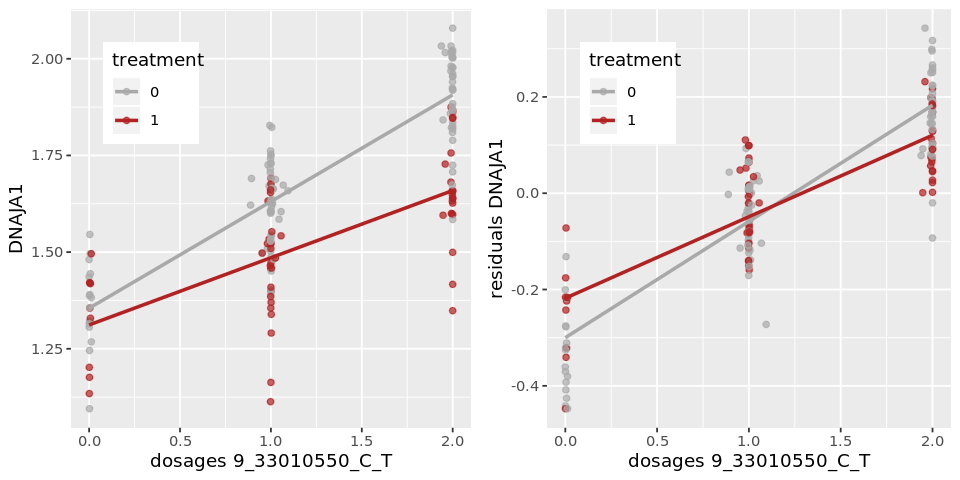

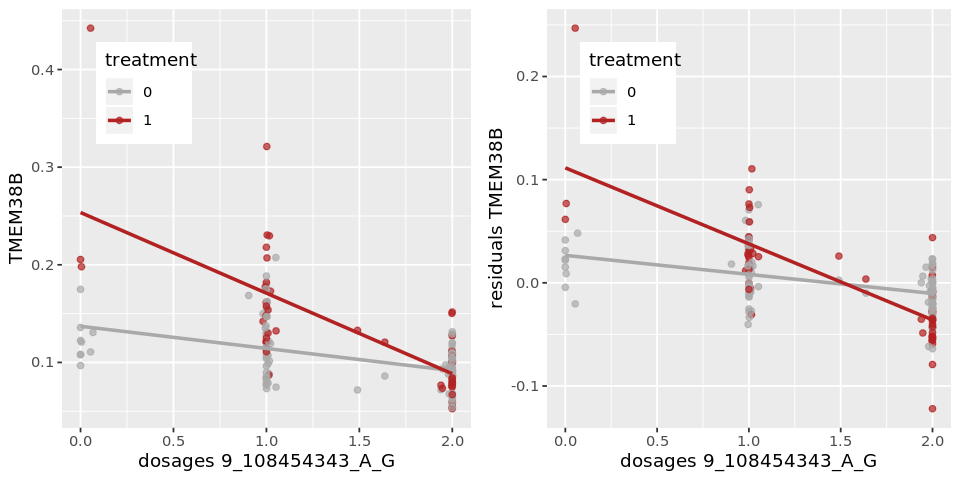

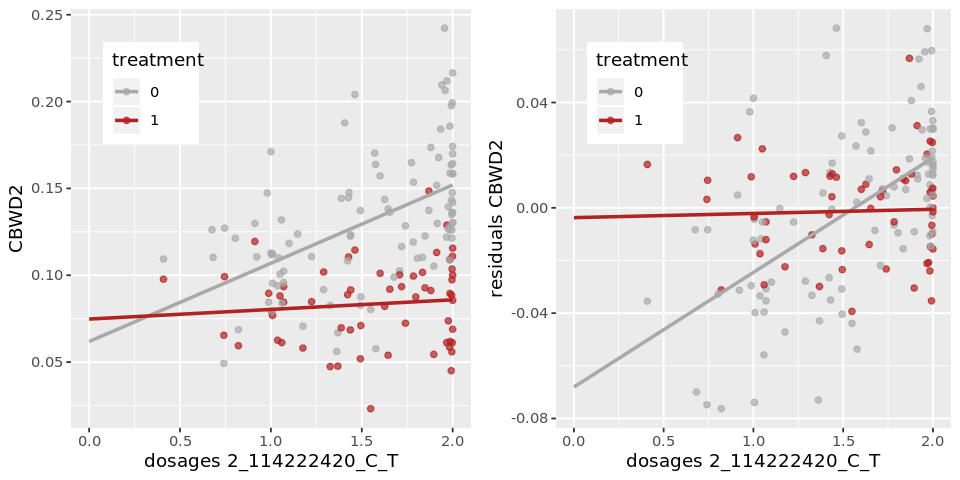

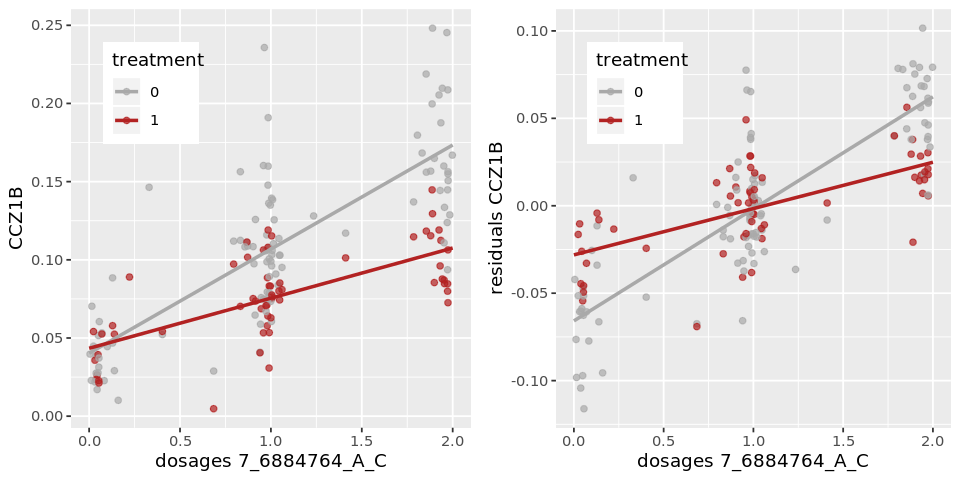

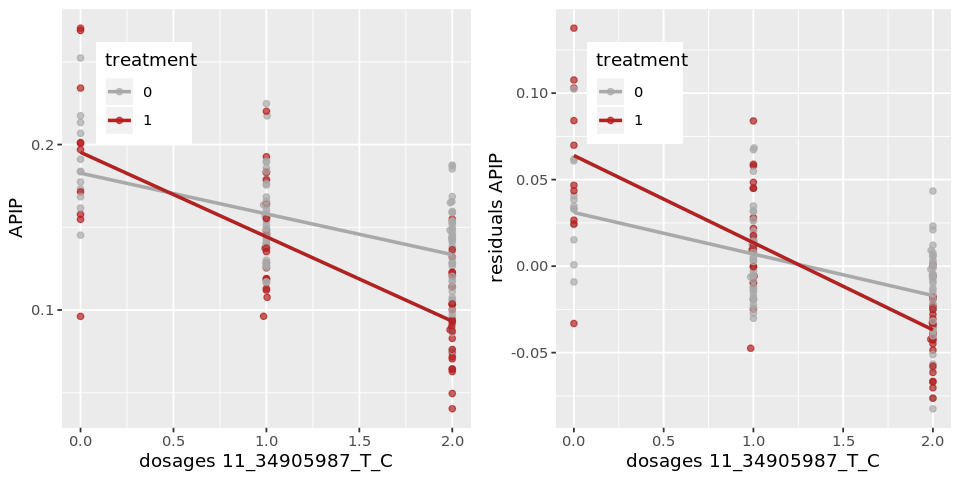

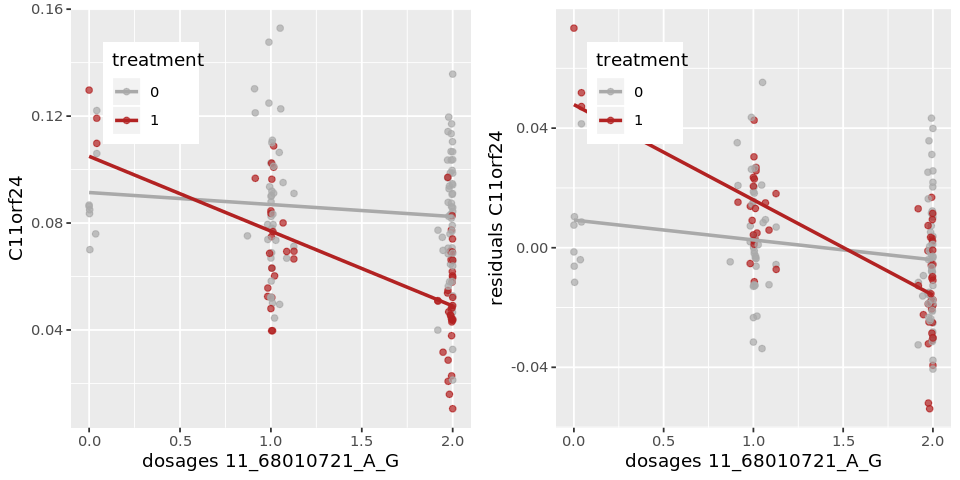

In [399]:
for (i in 1:length(snps_positive)){
#     print(i)
    snp = as.character(snps_positive[i])
#     print(snp)
    gene = as.character(int_DA[int_DA$snp_id == snp,"feature_id"])
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    df_e = data.frame(gene = t(e[rownames(e) == gene,]), index = gsub("\\.","-",colnames(e)))
    colnames(df_e)[1] = "gene"
#     head(df_e)
    df_e2 = inner_join(df_e,as.data.frame(cov),by = "index")
#     head(df_e2,2)
    #### get residuals (more accurately what we test)
    mylm = lm(formula = gene ~ PC2+PC3+PC4+PC5+PC6+PC7+PC8+PC9+PC10+treatment, data = df_e2)
    df_e2$res = mylm$residuals
    df_e2$donor_id = gsub("_NONE","",df_e2$index)
    df_e2$donor_id = gsub("_ROT","",df_e2$donor_id)
#     head(df_e2,2)
#     print(gene)

    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    df0 = inner_join(df_e2,g,by = "donor_id") 
    df0$genotypes <- round(df0$dosages)
    df0$treatment = as.factor(df0$treatment)
    p1 = ggplot(df0, aes(x = dosages, y = gene, col = treatment)) +  geom_point(alpha = 0.7) + 
        xlab(paste0("dosages ",snp)) + ylab(gene_name) + scale_color_manual(values=c(col_NONE, col_ROT)) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) + theme(legend.position = c(0.2, 0.8)) + xlim(c(0,2))
    p2 = ggplot(df0, aes(x = dosages, y = res, col = treatment)) +  geom_point(alpha = 0.7) + xlim(c(0,2)) +
        xlab(paste0("dosages ",snp)) + ylab(paste0("residuals ",gene_name)) + scale_color_manual(values=c(col_NONE, col_ROT)) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) + theme(legend.position = c(0.2, 0.8))
    
    options(repr.plot.width=8, repr.plot.height=4)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
}

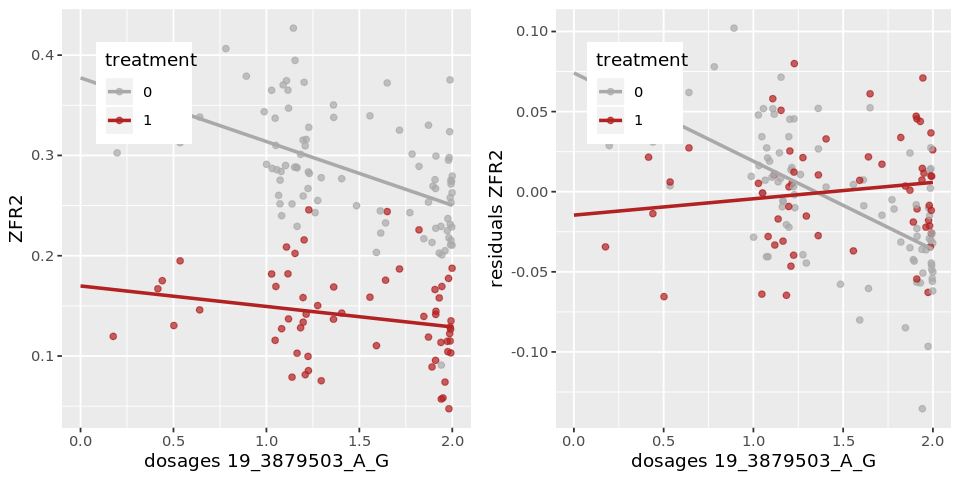

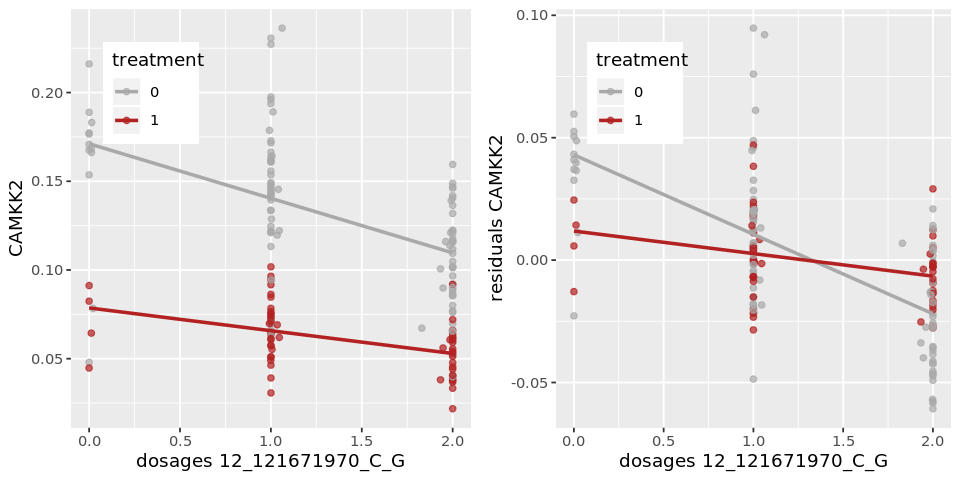

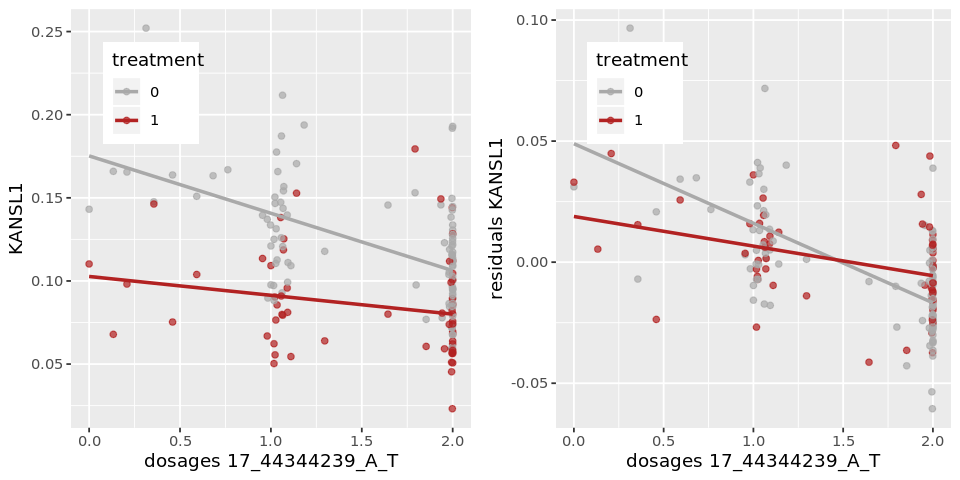

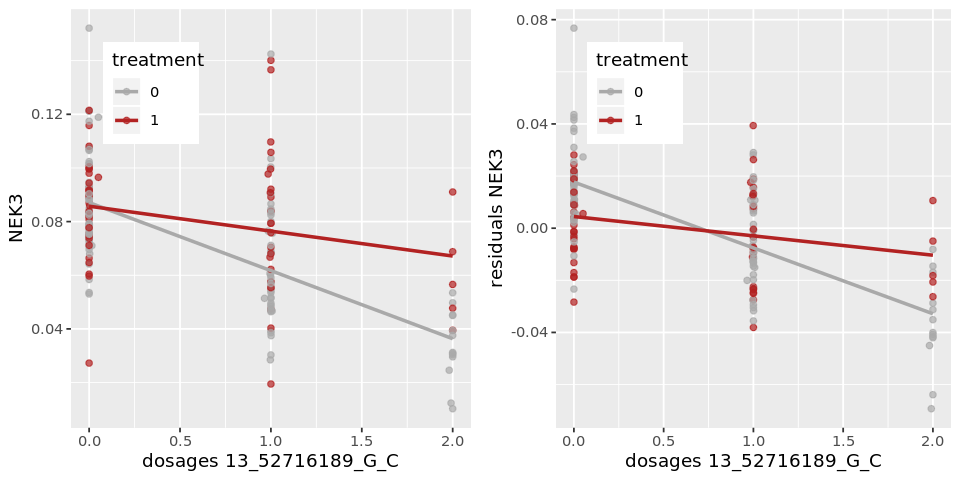

Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

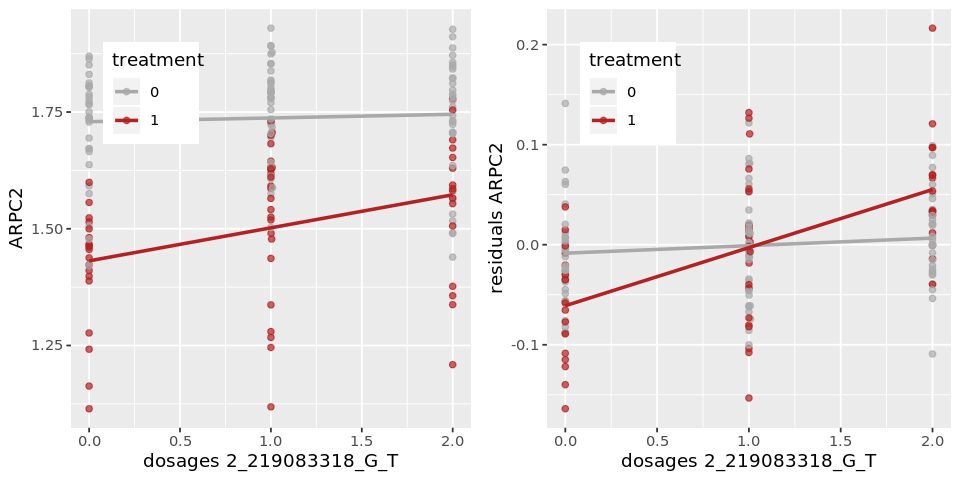

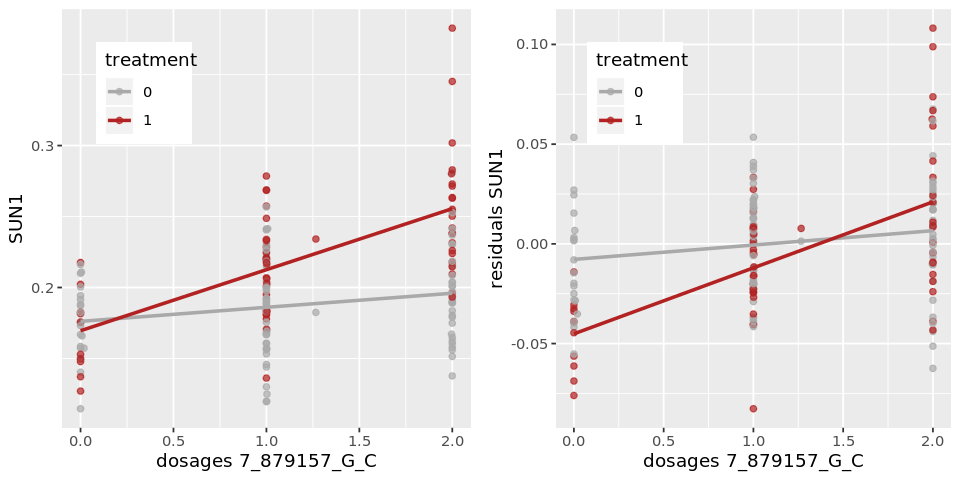

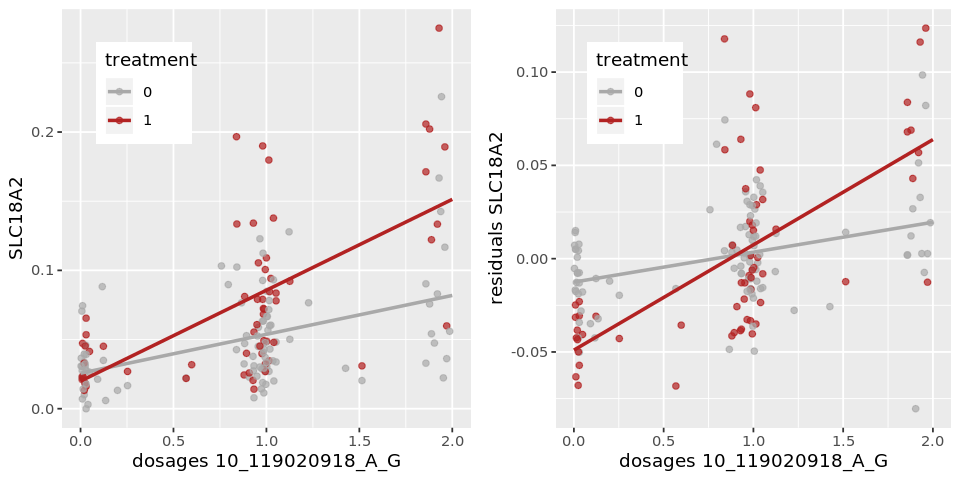

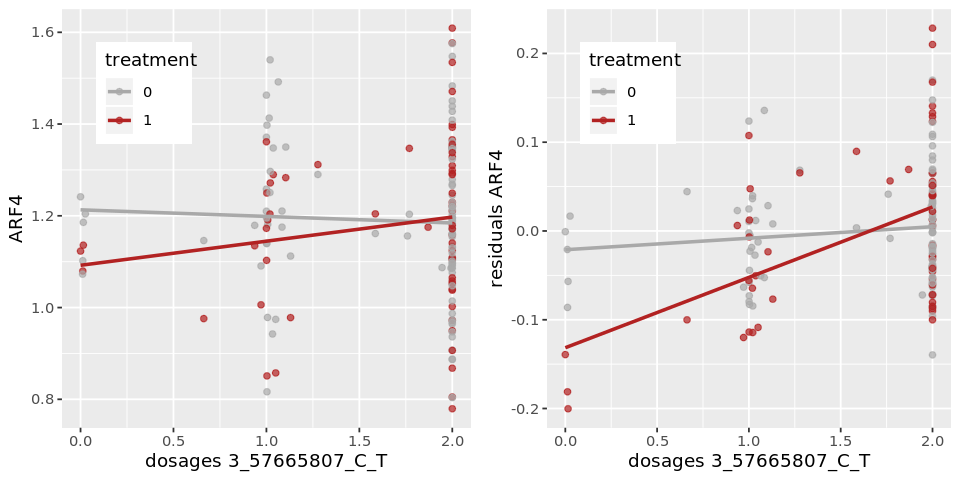

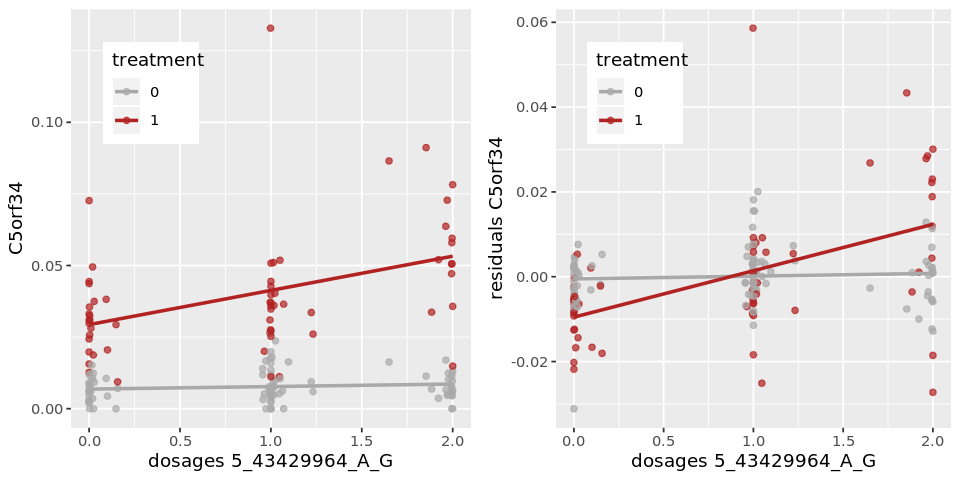

Warning message in `==.default`(annos$feature_id, as.character(gene)):
“longer object length is not a multiple of shorter object length”Warning message in is.na(e1) | is.na(e2):
“longer object length is not a multiple of shorter object length”

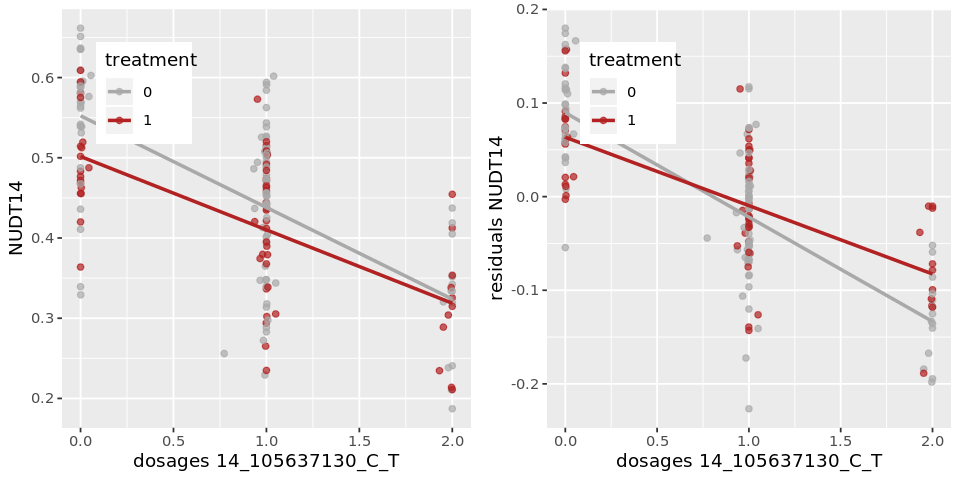

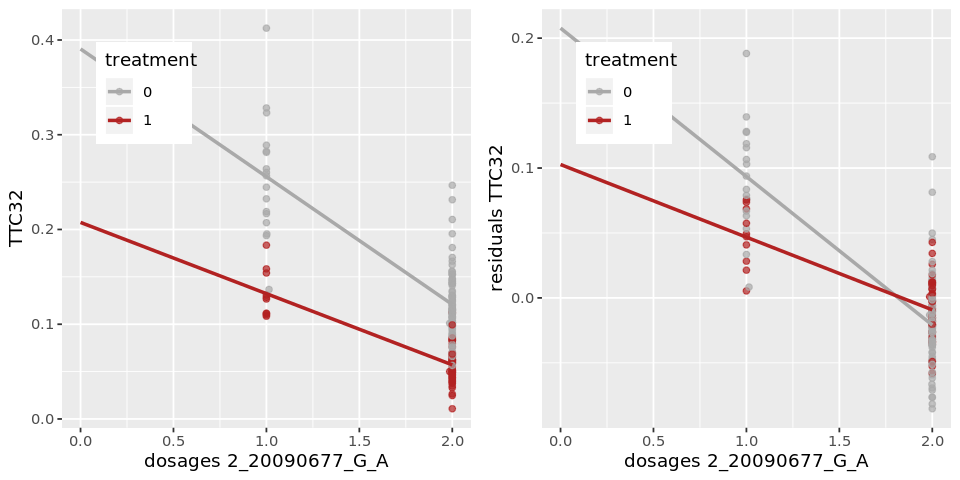

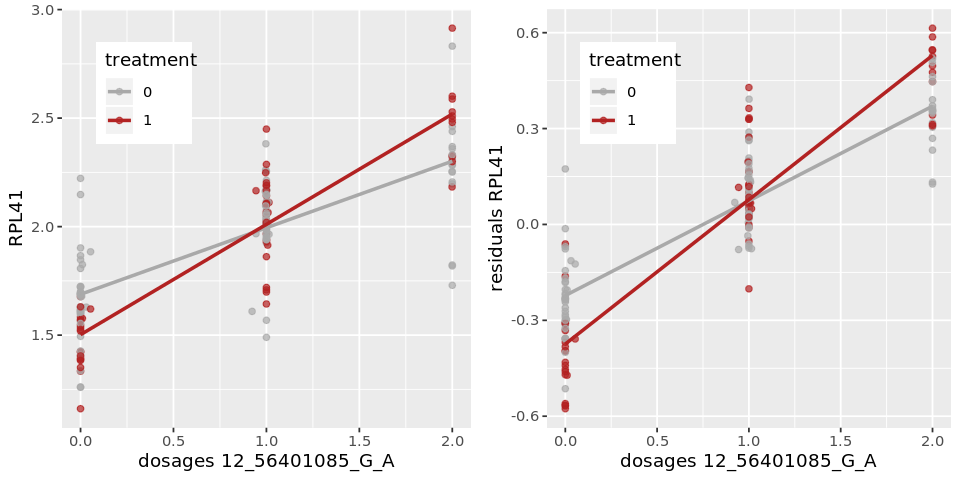

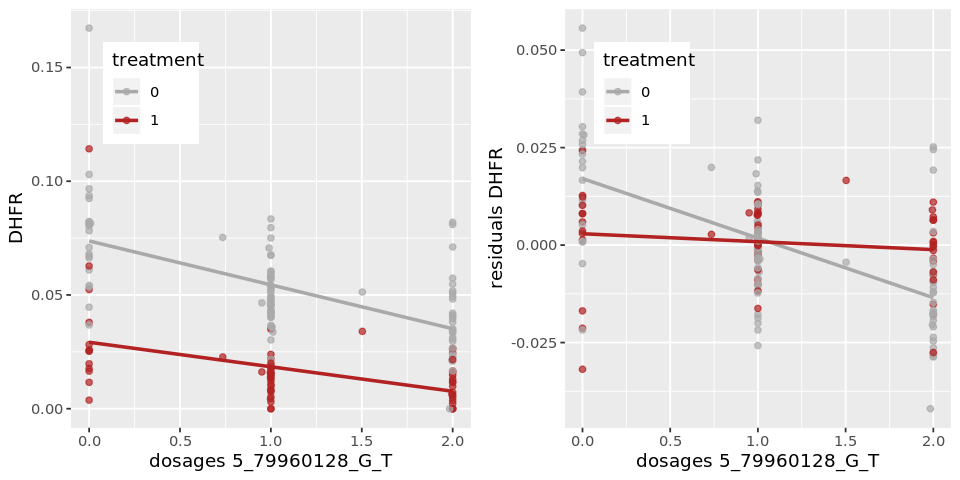

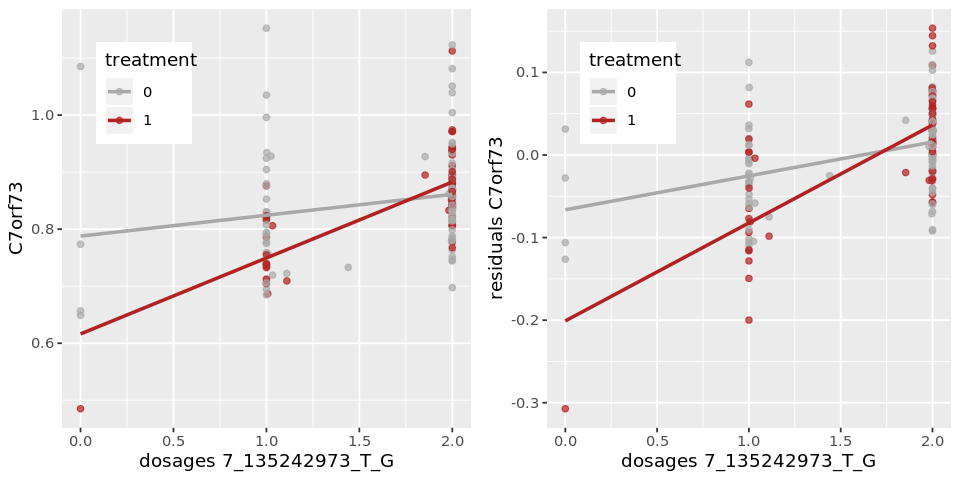

In [400]:
for (i in 1:length(snps_negative)){
#     print(i)
    snp = as.character(snps_negative[i])
#     print(snp)
    gene = as.character(int_DA[int_DA$snp_id == snp,"feature_id"])
    gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
    df_e = data.frame(gene = t(e[rownames(e) == gene,]), index = gsub("\\.","-",colnames(e)))
    colnames(df_e)[1] = "gene"
#     head(df_e)
    df_e2 = inner_join(df_e,as.data.frame(cov),by = "index")
#     head(df_e2,2)
    #### get residuals (more accurately what we test)
    mylm = lm(formula = gene ~ PC2+PC3+PC4+PC5+PC6+PC7+PC8+PC9+PC10+treatment, data = df_e2)
    df_e2$res = mylm$residuals
    df_e2$donor_id = gsub("_NONE","",df_e2$index)
    df_e2$donor_id = gsub("_ROT","",df_e2$donor_id)
#     head(df_e2,2)
#     print(gene)

    g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
    g$donor_id = as.character(g$donor_id)
    colnames(g)[2] = "dosages"
#     print(head(g,2))
    df0 = inner_join(df_e2,g,by = "donor_id") 
    df0$genotypes <- round(df0$dosages)
    df0$treatment = as.factor(df0$treatment)
    p1 = ggplot(df0, aes(x = dosages, y = gene, col = treatment)) +  geom_point(alpha = 0.7) + 
        xlab(paste0("dosages ",snp)) + ylab(gene_name) + scale_color_manual(values=c(col_NONE, col_ROT)) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) + theme(legend.position = c(0.2, 0.8)) + xlim(c(0,2))
    p2 = ggplot(df0, aes(x = dosages, y = res, col = treatment)) +  geom_point(alpha = 0.7) + xlim(c(0,2))+ 
        xlab(paste0("dosages ",snp)) + ylab(paste0("residuals ",gene_name)) + scale_color_manual(values=c(col_NONE, col_ROT)) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) + theme(legend.position = c(0.2, 0.8))
    
    options(repr.plot.width=8, repr.plot.height=4)
    print(cowplot::plot_grid(p1, p2, align = "h", ncol = 2))   
}

In [308]:
snp = "19_3879503_A_G"
snp = "12_121671970_C_G"
int_DA[int_DA$snp_id == snp,]

,snp_id,p_value,beta,beta_se,empirical_feature_p_value,feature_chromosome,feature_start,feature_end,n_samples,n_e_samples,snp_chromosome,snp_position,assessed_allele,call_rate,maf,hwe_p,feature_id,q_value
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
834,12_121671970_C_G,5.675866e-06,-0.5126496,0.1129652,-1,12,121675497,121736111,175,175,12,121671970,G,1,0.3514286,0.5065066,ENSG00000110931,0.001189803


In [309]:
# snp = "9_33010550_C_T"
# snp = "9_108454343_A_G"
# snp = "2_114222420_C_T"
# snp = "11_34905987_T_C"
int_DA[int_DA$snp_id == snp,]

,snp_id,p_value,beta,beta_se,empirical_feature_p_value,feature_chromosome,feature_start,feature_end,n_samples,n_e_samples,snp_chromosome,snp_position,assessed_allele,call_rate,maf,hwe_p,feature_id,q_value
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>
1881,11_34905987_T_C,3.636921e-08,0.7619326,0.1383412,-1,11,34874641,34938046,175,175,11,34905987,C,1,0.3428571,0.03045942,ENSG00000149089,2.439647e-05


In [310]:
-log10(int_DA[int_DA$snp_id == snp,"p_value"])

[1] 7.439266

In [311]:
gene = int_DA[int_DA$snp_id == snp,"feature_id"]
gene

[1] ENSG00000149089
3354 Levels: ENSG00000001460 ENSG00000002016 ENSG00000002549 ... ENSG00000272325

In [312]:
# annos_file = "/hps/nobackup/hipsci/scratch/singlecell_endodiff/data_processed/scQTLs/annos/combined_feature_id_annos.tsv"
# annos = read.csv(annos_file,sep="\t")
# # head(annos,2)
# annos$feature_id = annos$ensembl_gene_id
head(annos,2)

feature_id,chromosome,start,end,hgnc_symbol,combined_feature_id,ensembl_gene_id
<fct>,<fct>,<int>,<int>,<fct>,<fct>,<fct>
ENSG00000000003,X,99883667,99894988,TSPAN6,ENSG00000000003_TSPAN6,ENSG00000000003
ENSG00000000419,20,49551404,49575092,DPM1,ENSG00000000419_DPM1,ENSG00000000419


In [313]:
gene_name = as.character(annos[annos$feature_id == as.character(gene),"hgnc_symbol"])
gene_name

[1] "APIP"

In [314]:
# genos = read.table("/hps/nobackup/hipsci/scratch/genotypes/imputed/2017-03-27/Anna_selection_2020/neuroseq_Jan27.dosages.txt")
# colnames(genos) = gsub("\\.","-",colnames(genos))

In [315]:
head(genos)

,HPSI0514i-sohd_2,HPSI0115i-zihe_1,HPSI1014i-eesb_1,HPSI0913i-eika_2,HPSI0114i-lexy_2,HPSI1014i-quls_2,HPSI0514i-yewo_4,HPSI0314i-bubh_3,HPSI0714i-burb_1,HPSI0314i-xugn_2,⋯,HPSI0413i-nudd_1,HPSI0513i-pedc_1,HPSI0513i-dulv_1,HPSI0813i-peoj_1,HPSI0413i-yotv_2,HPSI0513i-dipe_1,HPSI0613i-bawa_1,HPSI0813i-aizi_3,HPSI0613i-hikj_2,HPSI0513i-momt_2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
13_21085751_A_T,0.902,0.935,0.387,0,0.357,0.005,0.019,0.681,0.605,0.768,⋯,0.025,0.313,0.008,1.027,0.004,0.028,0.896,0.929,0.016,0.944
13_21088717_T_C,0.914,0.947,0.671,0,0.336,0.015,0.001,0.962,0.609,0.783,⋯,0.011,0.312,0.003,1.014,0.000,0.018,0.977,0.940,0.007,0.993
13_21131211_C_A,0.731,0.005,1.112,1,0.996,0.992,1.033,0.999,0.006,1.006,⋯,1.994,1.000,0.003,0.002,0.966,1.027,0.998,0.000,0.996,0.005
13_21151047_T_C,1.000,1.000,2.000,1,1.000,1.000,0.999,0.000,0.000,0.000,⋯,0.000,0.000,0.000,0.000,0.956,0.000,0.002,0.000,1.000,0.000
13_21200260_C_T,1.001,1.468,1.010,1,1.951,1.578,1.077,2.000,1.999,2.000,⋯,2.000,1.982,2.000,2.000,1.007,2.000,2.000,2.000,1.004,2.000
13_21258328_T_C,1.000,0.988,1.000,1,1.000,1.000,0.003,1.000,2.000,1.000,⋯,0.003,1.000,2.000,2.000,1.000,0.995,0.981,2.000,1.000,2.000


In [316]:
genos[snp,]

,HPSI0514i-sohd_2,HPSI0115i-zihe_1,HPSI1014i-eesb_1,HPSI0913i-eika_2,HPSI0114i-lexy_2,HPSI1014i-quls_2,HPSI0514i-yewo_4,HPSI0314i-bubh_3,HPSI0714i-burb_1,HPSI0314i-xugn_2,⋯,HPSI0413i-nudd_1,HPSI0513i-pedc_1,HPSI0513i-dulv_1,HPSI0813i-peoj_1,HPSI0413i-yotv_2,HPSI0513i-dipe_1,HPSI0613i-bawa_1,HPSI0813i-aizi_3,HPSI0613i-hikj_2,HPSI0513i-momt_2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
11_34905987_T_C,1,1,1,2,1,2,2,1.001,2,1,⋯,1,2,0,0,2,1,1,1,2,2


In [317]:
mydir = '/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/'

In [318]:
# DA 
# DA = 'pool1_17_D52/pool1_17_D52.scanpy.w_metadata.w_celltype.scanpy.celltype.DA.groupedby.donor_id-celltype-treatment.mean.tsv'
# e_DA = read.csv(paste0(mydir,DA),sep="\t")

In [319]:
e_DA[1:2,1:5]

donor_id,celltype,treatment,n_cells,AP006222.2
<fct>,<fct>,<fct>,<int>,<dbl>
HPSI0114i-bezi_3,DA,NONE,66,0.3731484
HPSI0114i-bezi_3,DA,ROT,37,0.4486321


In [320]:
e = e_DA
e_ROT = e[e$treatment == "ROT",]
rownames(e_ROT) = e_ROT$donor_id
e_noROT = e[e$treatment == "NONE",]
rownames(e_noROT) = e_noROT$donor_id

In [321]:
g = data.frame(donor_id = colnames(genos), snp = t(genos[snp,]))
colnames(g)[2] = "dosages"
head(g,2)

,donor_id,dosages
,<fct>,<dbl>
HPSI0514i-sohd_2,HPSI0514i-sohd_2,1
HPSI0115i-zihe_1,HPSI0115i-zihe_1,1


In [322]:
e = e_DA[,c("donor_id","treatment",gene_name)]
df = inner_join(e,g,by = "donor_id")
colnames(df)[3] = "gene"
df$genotypes <- round(df$dosages)
head(df,2)

Warning message:
“Column `donor_id` joining factors with different levels, coercing to character vector”

donor_id,treatment,gene,dosages,genotypes
<chr>,<fct>,<dbl>,<dbl>,<dbl>
HPSI0114i-bezi_3,NONE,0.1504082,0.999,1
HPSI0114i-bezi_3,ROT,0.1224941,0.999,1


In [323]:
e = "/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/pool1_17_D52/qtl_analysis/eqtl_discovery/celltype_DA/treatment_interaction_test_ncellfilter_top_qtl_results_all/phenotypes.tsv"
cov = "/nfs/leia/research/stegle/dseaton/hipsci/singlecell_neuroseq/data/data_processed/pool1_17_D52/qtl_analysis/eqtl_discovery/celltype_DA/treatment_interaction_test_ncellfilter_top_qtl_results_all/covariates.tsv"

In [324]:
e = read.csv(e,sep='\t')
cov = read.csv(cov,sep='\t')

head(e,2)
rownames(e) <- e$ensembl_gene_id
e$ensembl_gene_id <- c()
head(e,2)
head(cov,2)

In [326]:
gene
df_e = data.frame(gene = t(e[rownames(e) == gene,]), index = gsub("\\.","-",colnames(e)))
colnames(df_e)[1] = "gene"
head(df_e)

df_e2 = inner_join(df_e,as.data.frame(cov),by = "index")
head(df_e2,2)

mylm = lm(formula = gene ~ PC2+PC3+PC4+PC5+PC6+PC7+PC8+PC9+PC10+treatment, data = df_e2)
df_e2$res = mylm$residuals

df_e2$donor_id = gsub("_NONE","",df_e2$index)
df_e2$donor_id = gsub("_ROT","",df_e2$donor_id)
head(df_e2,2)

[1] ENSG00000149089
3354 Levels: ENSG00000001460 ENSG00000002016 ENSG00000002549 ... ENSG00000272325

,gene,index
,<dbl>,<fct>
HPSI0114i.eipl_1_NONE,0.16485853,HPSI0114i-eipl_1_NONE
HPSI0114i.kolf_2_NONE,0.10758422,HPSI0114i-kolf_2_NONE
HPSI0114i.kolf_2_ROT,0.09223792,HPSI0114i-kolf_2_ROT
HPSI0114i.wegi_1_NONE,0.09579808,HPSI0114i-wegi_1_NONE
HPSI0114i.wegi_1_ROT,0.10346193,HPSI0114i-wegi_1_ROT
HPSI0114i.zapk_2_NONE,0.15139318,HPSI0114i-zapk_2_NONE


In [330]:
df0 = inner_join(df_e2,g,by = "donor_id") 

Warning message:
“Column `donor_id` joining character vector and factor, coercing into character vector”

In [331]:
head(df0,2)

gene,index,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,treatment,res,donor_id,dosages
<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<dbl>
0.1648585,HPSI0114i-eipl_1_NONE,-0.8613463,3.6201512,0.8571913,0.869795,0.0166284,0.9966108,-2.4393987,-0.8136387,1.06329440,0,0.009156391,HPSI0114i-eipl_1,1.99
0.1075842,HPSI0114i-kolf_2_NONE,-4.5142662,-0.5994026,-0.6775493,1.934727,-1.1497531,-0.4949584,0.2272581,-1.9469641,-0.08094774,0,-0.040258027,HPSI0114i-kolf_2,2.00


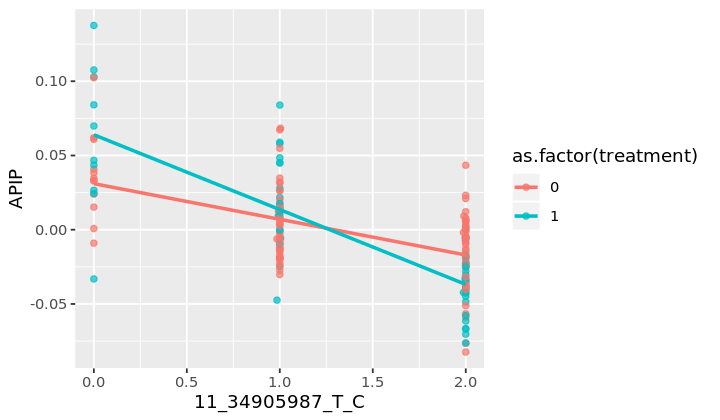

In [332]:
ggplot(df0, aes(x = dosages, y = res, col = as.factor(treatment))) +  geom_point(alpha = 0.7) + xlab(snp) + ylab(gene_name) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) 

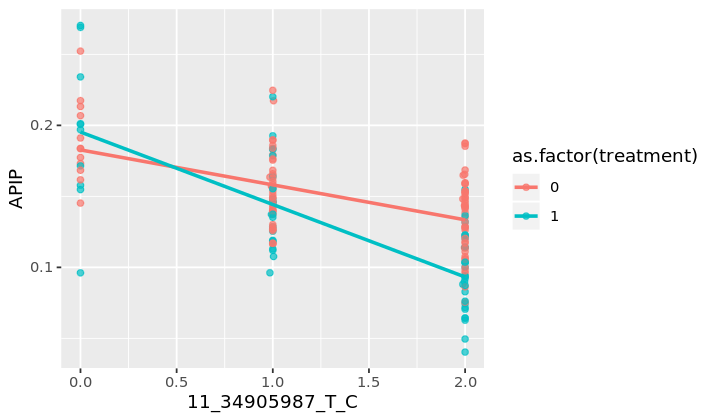

In [333]:
ggplot(df0, aes(x = dosages, y = gene, col = as.factor(treatment))) +  geom_point(alpha = 0.7) + xlab(snp) + ylab(gene_name) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) 

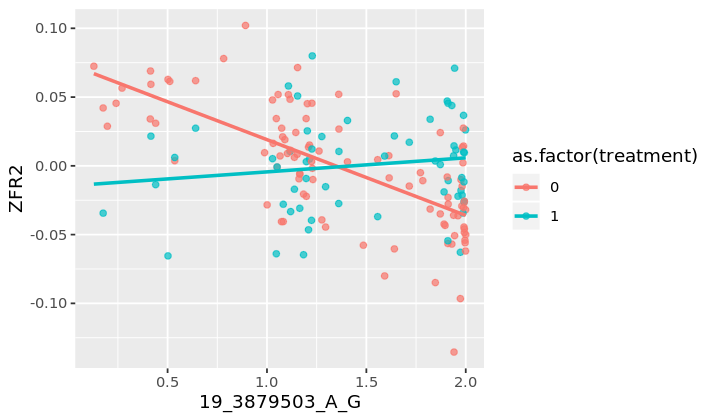

In [271]:
ggplot(df0, aes(x = dosages, y = res, col = as.factor(treatment))) +  geom_point(alpha = 0.7) + xlab(snp) + ylab(gene_name) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) 

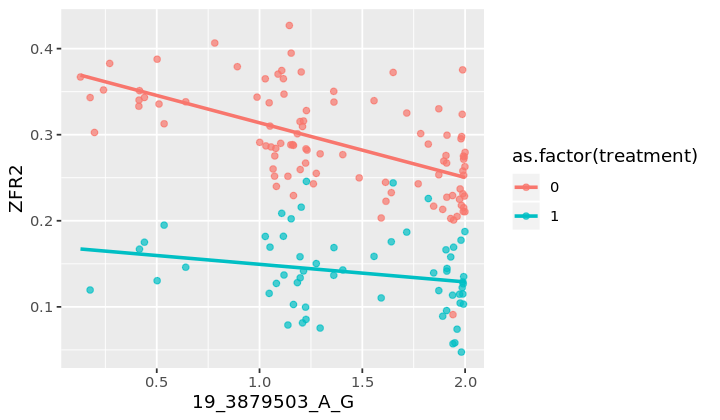

In [272]:
ggplot(df0, aes(x = dosages, y = gene, col = as.factor(treatment))) +  geom_point(alpha = 0.7) + xlab(snp) + ylab(gene_name) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) 

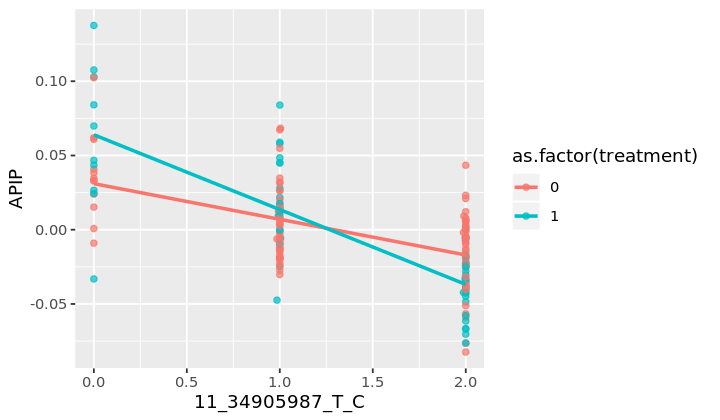

In [216]:
ggplot(df0, aes(x = dosages, y = res, col = as.factor(treatment))) +  geom_point(alpha = 0.7) + xlab(snp) + ylab(gene_name) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) 

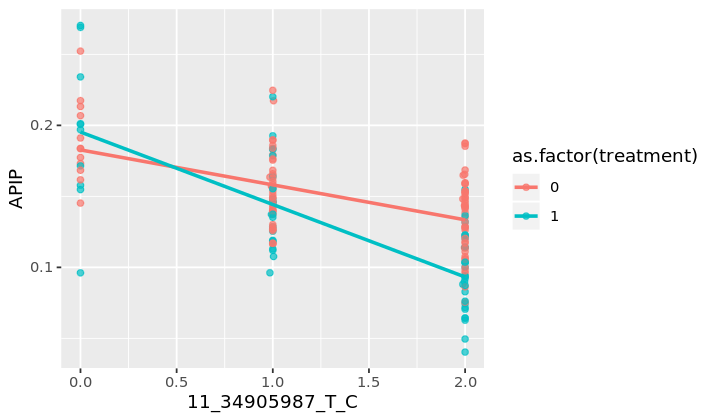

In [219]:
ggplot(df0, aes(x = dosages, y = gene, col = as.factor(treatment))) +  geom_point(alpha = 0.7) + xlab(snp) + ylab(gene_name) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) 

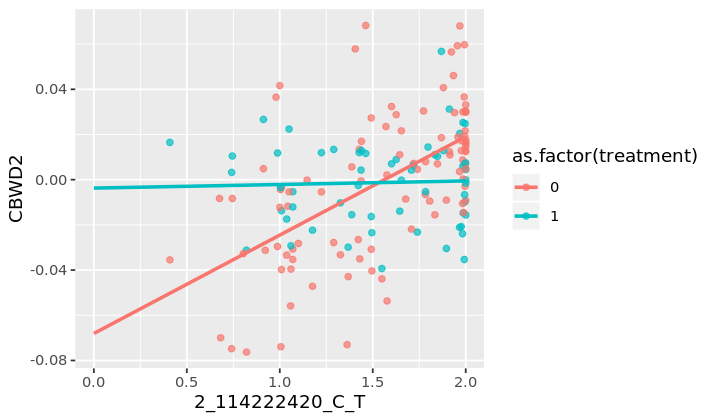

In [246]:
ggplot(df0, aes(x = dosages, y = res, col = as.factor(treatment))) +  geom_point(alpha = 0.7) + xlab(snp) + ylab(gene_name) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) +xlim(c(0,2))

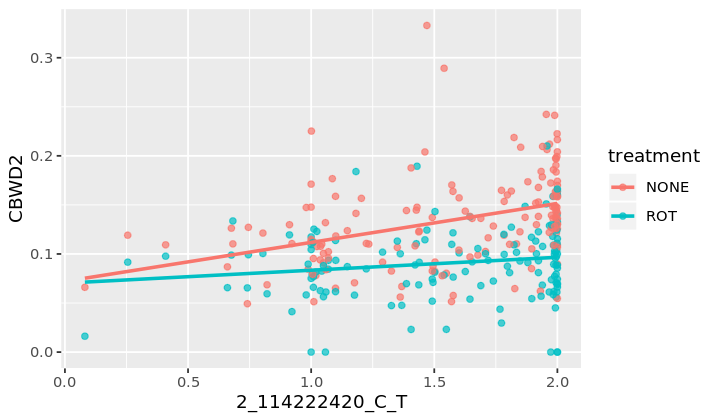

In [183]:
ggplot(df, aes(x = dosages, y = gene, col = treatment)) +  geom_point(alpha = 0.7) + xlab(snp) + ylab(gene_name) +
        geom_smooth(method = lm,  se = FALSE, fullrange = TRUE) 

In [334]:
e1 = e_noROT[,c("donor_id",gene_name)]
# head(e1,2)
df1 = inner_join(e1,g,by = "donor_id")
colnames(df1)[2] = "gene"
df1$genotypes <- round(df1$dosages)
head(df1,2)

Warning message:
“Column `donor_id` joining factors with different levels, coercing to character vector”

donor_id,gene,dosages,genotypes
<chr>,<dbl>,<dbl>,<dbl>
HPSI0114i-bezi_3,0.1504082,0.999,1
HPSI0114i-eipl_1,0.1648585,1.990,2


In [335]:
e2 = e_ROT[,c("donor_id",gene_name)]
# head(e2,2)
df2 = inner_join(e2,g,by = "donor_id")
colnames(df2)[2] = "gene"
df2$genotypes <- round(df2$dosages)
head(df2,2)

Warning message:
“Column `donor_id` joining factors with different levels, coercing to character vector”

donor_id,gene,dosages,genotypes
<chr>,<dbl>,<dbl>,<dbl>
HPSI0114i-bezi_3,0.1224941,0.999,1
HPSI0114i-eipl_1,0.0715140,1.990,2


[1] 0.1567887 0.1273498

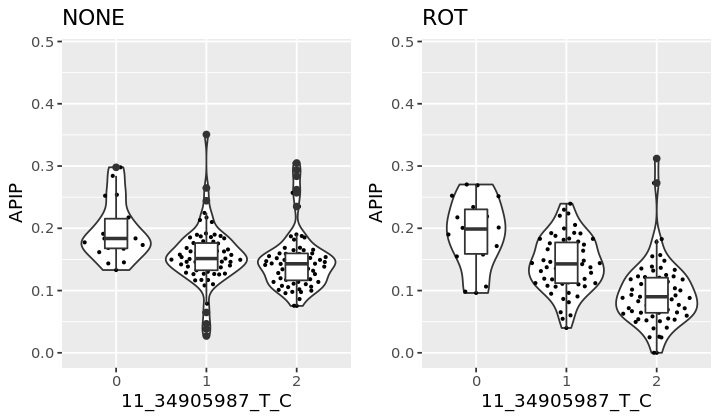

In [336]:
c(mean(df1$gene),mean(df2$gene))
p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0,0.48)) + ggtitle("NONE")
p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0,0.48)) + ggtitle("ROT")
options(repr.plot.width=6, repr.plot.height=3.5)
cowplot::plot_grid(p1, p2, align = "h", ncol = 2)    

[1] 0.1567887 0.1273498

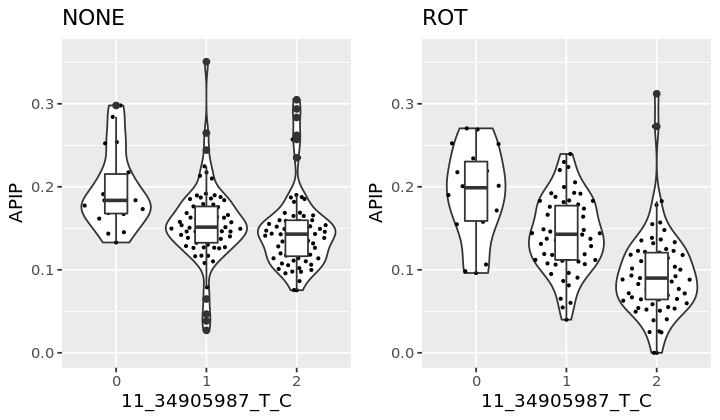

In [307]:
c(mean(df1$gene),mean(df2$gene))
p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0,0.36)) + ggtitle("NONE")
p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0,0.36)) + ggtitle("ROT")
options(repr.plot.width=6, repr.plot.height=3.5)
cowplot::plot_grid(p1, p2, align = "h", ncol = 2)    

[1] 0.13405038 0.09070066

Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 1 rows containing missing values (position_quasirandom).”

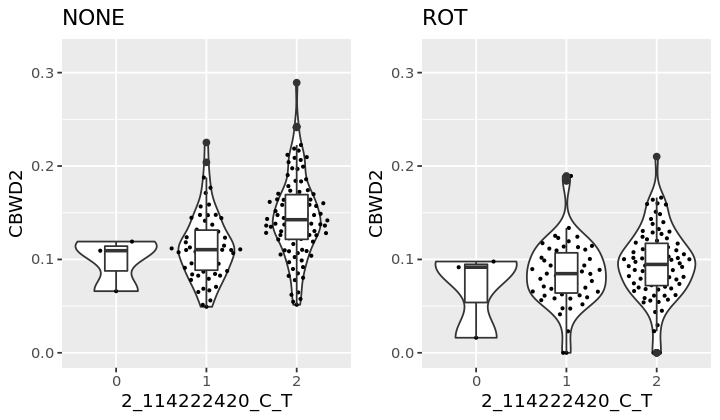

In [126]:
c(mean(df1$gene),mean(df2$gene))
p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0,0.32)) + ggtitle("NONE")
p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0,0.32)) + ggtitle("ROT")
options(repr.plot.width=6, repr.plot.height=3.5)
cowplot::plot_grid(p1, p2, align = "h", ncol = 2)    

[1] 0.1079452 0.1447856

Warning message:
“Removed 2 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 2 rows containing non-finite values (stat_boxplot).”Warning message:
“Removed 2 rows containing missing values (position_quasirandom).”

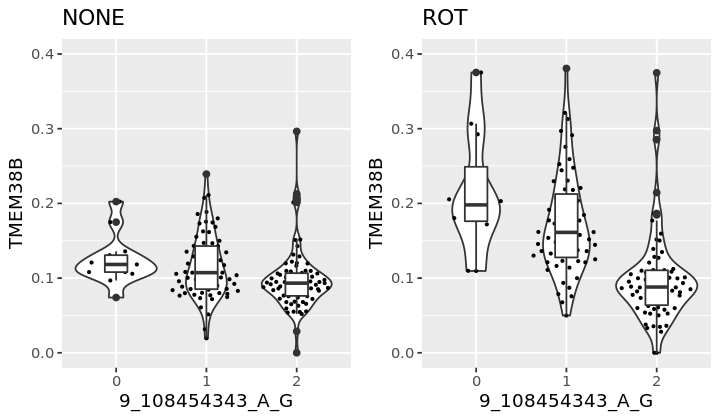

In [92]:
c(mean(df1$gene),mean(df2$gene))
p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0,0.4)) + ggtitle("NONE")
p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0,0.4)) + ggtitle("ROT")
options(repr.plot.width=6, repr.plot.height=3.5)
cowplot::plot_grid(p1, p2, align = "h", ncol = 2)    

[1] 1.690916 1.516049

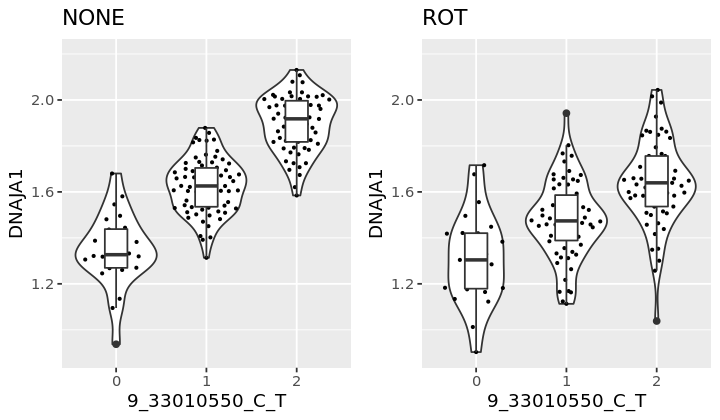

In [108]:
c(mean(df1$gene),mean(df2$gene))
p1 = ggplot(df1, aes(x = as.factor(genotypes), y = gene)) +  geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0.9,2.2)) + ggtitle("NONE")
p2 = ggplot(df2, aes(x = as.factor(genotypes), y = gene))  + geom_violin() + xlab(snp) + ylab(gene_name) +
                geom_quasirandom(size = 0.5) + geom_boxplot(width = 0.25) + ylim(c(0.9,2.2)) + ggtitle("ROT")
options(repr.plot.width=6, repr.plot.height=3.5)
cowplot::plot_grid(p1, p2, align = "h", ncol = 2)    